# **Regression**

---
## Setup
---


In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [2]:
mycolors = sns.color_palette("flare", 15)

# Set dark theme (similar to VSCode dark)
sns.set_theme(style="darkgrid", palette=mycolors, )

mycolors

[(0.92392172, 0.62835879, 0.46665526),
 (0.9173814, 0.56750099, 0.4298371),
 (0.90921368, 0.5056543, 0.39544411),
 (0.89737819, 0.44322747, 0.37043052),
 (0.87947728, 0.38172422, 0.35953127),
 (0.8513284, 0.32604977, 0.36620106),
 (0.81085964, 0.28202508, 0.38509649),
 (0.75861834, 0.25356035, 0.40663694),
 (0.69970218, 0.23611179, 0.42313282),
 (0.64061624, 0.22016818, 0.43446845),
 (0.5822395, 0.20425693, 0.44098758),
 (0.52386353, 0.18939409, 0.44182449),
 (0.46446454, 0.17716458, 0.43486036),
 (0.40504765, 0.16574261, 0.42072062),
 (0.34671861, 0.1529053, 0.40193587)]

---
## Inspect Data 
---

In [3]:
df = pd.read_csv("C:/Users/Omar/Downloads/archive (9)/AmesHousing.csv")
df

,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,1,526301100,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,215000
1,2,526350040,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,...,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,105000
2,3,526351010,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,172000
3,4,526353030,20,RL,93.0,11160,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,244000
4,5,527105010,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,...,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,189900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2925,2926,923275080,80,RL,37.0,7937,Pave,NaN,IR1,Lvl,...,0,NaN,GdPrv,NaN,0,3,2006,WD,Normal,142500
2926,2927,923276100,20,RL,NaN,8885,Pave,NaN,IR1,Low,...,0,NaN,MnPrv,NaN,0,6,2006,WD,Normal,131000
2927,2928,923400125,85,RL,62.0,10441,Pave,NaN,Reg,Lvl,...,0,NaN,MnPrv,Shed,700,7,2006,WD,Normal,132000
2928,2929,924100070,20,RL,77.0,10010,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,4,2006,WD,Normal,170000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 82 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Order            2930 non-null   int64  
 1   PID              2930 non-null   int64  
 2   MS SubClass      2930 non-null   int64  
 3   MS Zoning        2930 non-null   object 
 4   Lot Frontage     2440 non-null   float64
 5   Lot Area         2930 non-null   int64  
 6   Street           2930 non-null   object 
 7   Alley            198 non-null    object 
 8   Lot Shape        2930 non-null   object 
 9   Land Contour     2930 non-null   object 
 10  Utilities        2930 non-null   object 
 11  Lot Config       2930 non-null   object 
 12  Land Slope       2930 non-null   object 
 13  Neighborhood     2930 non-null   object 
 14  Condition 1      2930 non-null   object 
 15  Condition 2      2930 non-null   object 
 16  Bldg Type        2930 non-null   object 
 17  House Style   

In [5]:
print("Nulls in Columns")
print("=="*10)
df.isnull().sum()

Nulls in Columns


Order               0
PID                 0
MS SubClass         0
MS Zoning           0
Lot Frontage      490
                 ... 
Mo Sold             0
Yr Sold             0
Sale Type           0
Sale Condition      0
SalePrice           0
Length: 82, dtype: int64

In [6]:
num_col = df.select_dtypes(include=['float64','int64']).columns
print(num_col)
print(f"Number of numerical fetures: {len(num_col)}")

Index(['Order', 'PID', 'MS SubClass', 'Lot Frontage', 'Lot Area',
       'Overall Qual', 'Overall Cond', 'Year Built', 'Year Remod/Add',
       'Mas Vnr Area', 'BsmtFin SF 1', 'BsmtFin SF 2', 'Bsmt Unf SF',
       'Total Bsmt SF', '1st Flr SF', '2nd Flr SF', 'Low Qual Fin SF',
       'Gr Liv Area', 'Bsmt Full Bath', 'Bsmt Half Bath', 'Full Bath',
       'Half Bath', 'Bedroom AbvGr', 'Kitchen AbvGr', 'TotRms AbvGrd',
       'Fireplaces', 'Garage Yr Blt', 'Garage Cars', 'Garage Area',
       'Wood Deck SF', 'Open Porch SF', 'Enclosed Porch', '3Ssn Porch',
       'Screen Porch', 'Pool Area', 'Misc Val', 'Mo Sold', 'Yr Sold',
       'SalePrice'],
      dtype='object')
Number of numerical fetures: 39


In [7]:
cat_col = df.select_dtypes(include=['object']).columns
print(cat_col)
print(f"Number of Categorical fetures: {len(cat_col)}")

Index(['MS Zoning', 'Street', 'Alley', 'Lot Shape', 'Land Contour',
       'Utilities', 'Lot Config', 'Land Slope', 'Neighborhood', 'Condition 1',
       'Condition 2', 'Bldg Type', 'House Style', 'Roof Style', 'Roof Matl',
       'Exterior 1st', 'Exterior 2nd', 'Mas Vnr Type', 'Exter Qual',
       'Exter Cond', 'Foundation', 'Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure',
       'BsmtFin Type 1', 'BsmtFin Type 2', 'Heating', 'Heating QC',
       'Central Air', 'Electrical', 'Kitchen Qual', 'Functional',
       'Fireplace Qu', 'Garage Type', 'Garage Finish', 'Garage Qual',
       'Garage Cond', 'Paved Drive', 'Pool QC', 'Fence', 'Misc Feature',
       'Sale Type', 'Sale Condition'],
      dtype='object')
Number of Categorical fetures: 43


---
## Feature Selection
---

### Pearson Rank
---

> **Note:** Pearson correlation is shown here for comparison only. Because SalePrice is right-skewed, Pearson values are suppressed. Spearman rank correlation (next section) is used for the actual feature selection.


In [8]:
# Calculate correlation of all numerical columns with 'price'
correlation = df[num_col].corr()['SalePrice']

# Look at the absolute values to find the strongest relationships, then sort them
strongest_numerical_features = correlation.abs().sort_values(ascending=False)

print("Most correlated numerical features:")
print(strongest_numerical_features.head(10)) # Look at the top 10


Most correlated numerical features:
SalePrice         1.000000
Overall Qual      0.799262
Gr Liv Area       0.706780
Garage Cars       0.647877
Garage Area       0.640401
Total Bsmt SF     0.632280
1st Flr SF        0.621676
Year Built        0.558426
Full Bath         0.545604
Year Remod/Add    0.532974
Name: SalePrice, dtype: float64


### Spearman rank
---

In [9]:
# Use Spearman rank correlation instead of Pearson (the default) as results of coleration with Pearson was very low 
correlation = df[num_col].corr(method='spearman')['SalePrice']
strongest_numerical_features = correlation.abs().sort_values(ascending=False)

print(strongest_numerical_features.head(10))

SalePrice         1.000000
Overall Qual      0.808800
Gr Liv Area       0.723342
Garage Cars       0.701813
Year Built        0.680822
Garage Area       0.660676
Garage Yr Blt     0.637674
Full Bath         0.634161
Total Bsmt SF     0.606184
Year Remod/Add    0.601454
Name: SalePrice, dtype: float64


- Here the values is more correlated so we will choose the columns ['Overall Qual','Gr Liv Area','Garage Cars','Total Bsmt SF','Year Built','Year Remod/Add','1st Flr SF'] from the numerical features. (Garage Area and Garage Yr Blt are dropped due to collinearity.)


### Mutual Information for ' coleration between categorical fetures and numerical continous target '
---

In [10]:
#Mutual information to measure correlation between categorical features and numerical target

from sklearn.feature_selection import mutual_info_regression
from sklearn.preprocessing import OrdinalEncoder

# fillna with 'MISSING' before encoding to avoid NaN in encoded matrix
df_cat = df[cat_col].copy().fillna('MISSING').astype(str)
encoder = OrdinalEncoder()
df_cat_encoded = encoder.fit_transform(df_cat)

valid_idx = df['SalePrice'].dropna().index
mi_scores = mutual_info_regression(df_cat_encoded[valid_idx],
                                    df.loc[valid_idx, 'SalePrice'])

mi_results = pd.DataFrame({
    'Feature': cat_col,
    'MI_Score': mi_scores
}).sort_values(by='MI_Score', ascending=False)

print(mi_results.head(20))


           Feature  MI_Score
8     Neighborhood  0.560923
21       Bsmt Qual  0.366380
18      Exter Qual  0.328012
30    Kitchen Qual  0.321533
34   Garage Finish  0.267053
20      Foundation  0.238475
33     Garage Type  0.222858
32    Fireplace Qu  0.219111
24  BsmtFin Type 1  0.179732
16    Exterior 2nd  0.174803
27      Heating QC  0.167143
15    Exterior 1st  0.164688
0        MS Zoning  0.130512
17    Mas Vnr Type  0.118978
23   Bsmt Exposure  0.107227
12     House Style  0.103804
35     Garage Qual  0.093125
41       Sale Type  0.083894
42  Sale Condition  0.079814
37     Paved Drive  0.077136


- We will choose ['Neighborhood','Bsmt Qual']

### Visualize of price column 
---

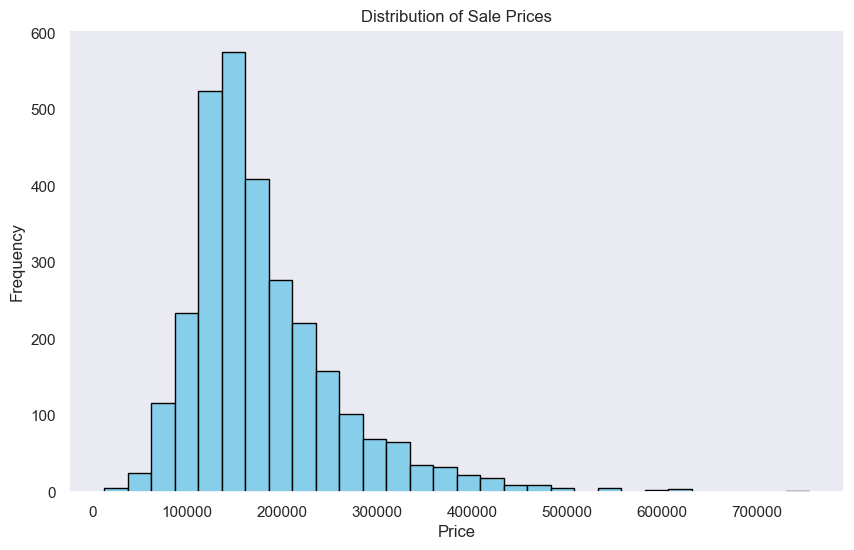

In [11]:
#Distribution of prices 

prices = df['SalePrice'].dropna()
plt.figure(figsize=(10, 6))
prices.hist(bins=30, color='skyblue', edgecolor='black')

plt.title('Distribution of Sale Prices')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.grid(False)

plt.show()


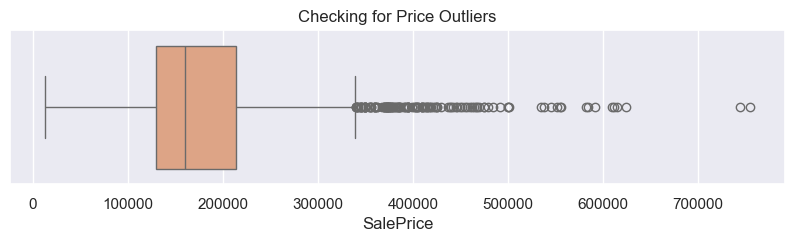

In [12]:
# Box plot for price
plt.figure(figsize=(10, 2))
sns.boxplot(x=df['SalePrice'])
plt.title("Checking for Price Outliers")
plt.show()

- The boxplot & histogram show that the price column have outliers so it will be handeled

### IQR Outliers Handiling 
---

In [13]:
# IQR method — informational only.
# Outliers are NOT removed here; the log transformation below handles skew.

Q1 = df['SalePrice'].quantile(0.25)
Q3 = df['SalePrice'].quantile(0.75)

IQR = Q3 - Q1

lower= Q1 - 1.5 * IQR
upper= Q3 + 1.5 * IQR

outliers = ((df['SalePrice']< lower) | (df['SalePrice']> upper)).sum()
print(f"Found {outliers} outliers (will be handled via log transformation, not removal)")


Found 137 outliers (will be handled via log transformation, not removal)


### Log Transformation 
---

In [14]:
# Log Transformation to transform outliers

# Create a new column with the logarithmic values 
df['price_log'] = np.log1p(df['SalePrice'])
df['price_log']


# Now check the correlation against the logged column!
num_col = df.select_dtypes(include= ['float64','int64']).columns
correlation = df[num_col].corr()['price_log']
print(correlation.abs().sort_values(ascending=False).head(10))

price_log         1.000000
SalePrice         0.946304
Overall Qual      0.825645
Gr Liv Area       0.695863
Garage Cars       0.675318
Garage Area       0.651132
Total Bsmt SF     0.625099
Year Built        0.615485
1st Flr SF        0.602629
Year Remod/Add    0.586153
Name: price_log, dtype: float64


- After the Log transformation to handle the outliers for price we will take ['Overall Qual','Gr Liv Area','Garage Cars','Total Bsmt SF','Year Built','Year Remod/Add','1st Flr SF'] for numerical features.

> **Note:** `Garage Area` is dropped — it is nearly collinear with `Garage Cars` (both measure garage size). Keeping both would introduce multicollinearity. `Garage Yr Blt` is also dropped — it is heavily correlated with `Year Built` since garages are almost always built with the house.


### Visualize Price After Log Transformation 
---

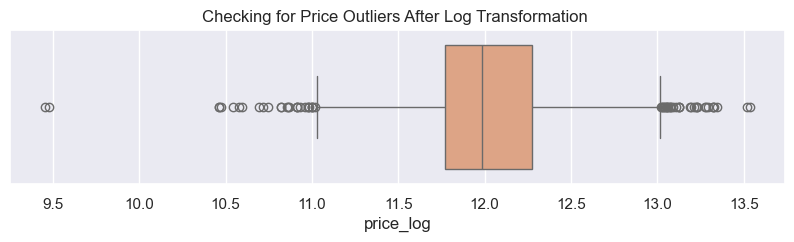

In [15]:
# boxplot for the price_log to check outliers Transformation 
plt.figure(figsize=(10, 2))
sns.boxplot(x=df['price_log'])
plt.title("Checking for Price Outliers After Log Transformation ")
plt.show()

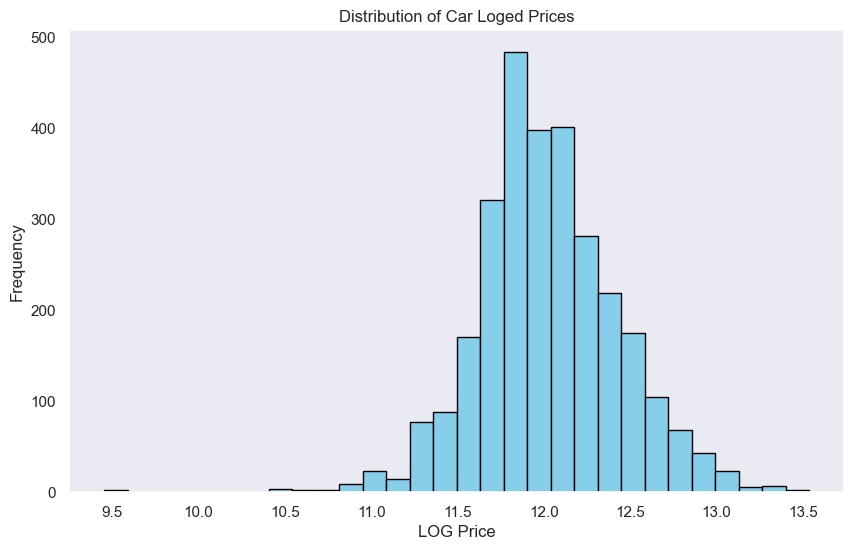

In [16]:
prices = df['price_log'].dropna()
plt.figure(figsize=(10, 6))
prices.hist(bins=30, color='skyblue', edgecolor='black')

plt.title('Distribution of Car Loged Prices')
plt.xlabel('LOG Price')
plt.ylabel('Frequency')
plt.grid(False)

plt.show()

- Showen the boxplot & histogram after handiling the outliers

---
## New Data after Feature selection 
---

In [17]:
# SalePrice is excluded — price_log is the target; keeping the raw price
# would be a redundant column that is never used as a feature.
# Garage Area is excluded — highly collinear with Garage Cars.
# Garage Yr Blt is excluded — highly correlated with Year Built.
df_f = df[['price_log','Neighborhood','Bsmt Qual','Overall Qual','Gr Liv Area',
           'Garage Cars','Total Bsmt SF','Year Built','Year Remod/Add','1st Flr SF']]
df_f


,price_log,Neighborhood,Bsmt Qual,Overall Qual,Gr Liv Area,Garage Cars,Total Bsmt SF,Year Built,Year Remod/Add,1st Flr SF
0,12.278398,NAmes,TA,6,1656,2.0,1080.0,1960,1960,1656
1,11.561725,NAmes,TA,5,896,1.0,882.0,1961,1961,896
2,12.055256,NAmes,TA,6,1329,1.0,1329.0,1958,1958,1329
3,12.404928,NAmes,TA,7,2110,2.0,2110.0,1968,1968,2110
4,12.154258,Gilbert,Gd,5,1629,2.0,928.0,1997,1998,928
...,...,...,...,...,...,...,...,...,...,...
2925,11.867104,Mitchel,TA,6,1003,2.0,1003.0,1984,1984,1003
2926,11.782960,Mitchel,Gd,5,902,2.0,864.0,1983,1983,902
2927,11.790565,Mitchel,Gd,5,970,0.0,912.0,1992,1992,970
2928,12.043560,Mitchel,Gd,5,1389,2.0,1389.0,1974,1975,1389


## - The Target Variable
 - price_log: The log-transformed (np.log1p) version of SalePrice. Using the log scale stabilises variance and reduces the impact of high-value outliers.

## - Location & Quality
 - Neighborhood: The physical neighbourhood within Ames, Iowa. Location is famously the strongest driver of real-estate prices.
 - Overall Qual: Overall material and finish quality, rated 1 (Very Poor) to 10 (Excellent). Typically the single strongest numerical predictor.
 - Bsmt Qual: Basement quality/height rating (Ex / Gd / TA / Fa / Po / NA).

## - Size Measurements
 - Gr Liv Area: Above-grade living area in sq ft (excludes basement).
 - 1st Flr SF: First-floor square footage.
 - Total Bsmt SF: Total basement square footage.

## - Garage
 - Garage Cars: Garage capacity in number of cars. (`Garage Area` was dropped — it is nearly collinear with Garage Cars.)

## - Time
 - Year Built: Year the house was originally constructed.
 - Year Remod/Add: Year of the most recent remodel or addition (equals Year Built if never remodelled).
 - (`Garage Yr Blt` was dropped — strongly correlated with Year Built.)


In [18]:
df_f.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   price_log       2930 non-null   float64
 1   Neighborhood    2930 non-null   object 
 2   Bsmt Qual       2850 non-null   object 
 3   Overall Qual    2930 non-null   int64  
 4   Gr Liv Area     2930 non-null   int64  
 5   Garage Cars     2929 non-null   float64
 6   Total Bsmt SF   2929 non-null   float64
 7   Year Built      2930 non-null   int64  
 8   Year Remod/Add  2930 non-null   int64  
 9   1st Flr SF      2930 non-null   int64  
dtypes: float64(3), int64(5), object(2)
memory usage: 229.0+ KB


In [19]:
df_f.describe() # Describtion for Numerical Fetures 

,price_log,Overall Qual,Gr Liv Area,Garage Cars,Total Bsmt SF,Year Built,Year Remod/Add,1st Flr SF
count,2930.000000,2930.000000,2930.000000,2929.000000,2929.000000,2930.000000,2930.000000,2930.000000
mean,12.020975,6.094881,1499.690444,1.766815,1051.614544,1971.356314,1984.266553,1159.557679
std,0.407584,1.411026,505.508887,0.760566,440.615067,30.245361,20.860286,391.890885
min,9.456419,1.000000,334.000000,0.000000,0.000000,1872.000000,1950.000000,334.000000
25%,11.771444,5.000000,1126.000000,1.000000,793.000000,1954.000000,1965.000000,876.250000
50%,11.982935,6.000000,1442.000000,2.000000,990.000000,1973.000000,1993.000000,1084.000000
75%,12.271397,7.000000,1742.750000,2.000000,1302.000000,2001.000000,2004.000000,1384.000000
max,13.534474,10.000000,5642.000000,5.000000,6110.000000,2010.000000,2010.000000,5095.000000


In [20]:
# Describtion for Categorical Fetures 
df_f.select_dtypes(include=[object]).describe()

,Neighborhood,Bsmt Qual
count,2930,2850
unique,28,5
top,NAmes,TA
freq,443,1283


In [21]:
print("Nulls in Columns")
print("=="*10)
df_f.isnull().sum()

Nulls in Columns


price_log          0
Neighborhood       0
Bsmt Qual         80
Overall Qual       0
Gr Liv Area        0
Garage Cars        1
Total Bsmt SF      1
Year Built         0
Year Remod/Add     0
1st Flr SF         0
dtype: int64

In [22]:
num_col = df_f.select_dtypes(include=['float64','int64']).columns
print(num_col)
print(f"Number of numerical fetures: {len(num_col)}")

Index(['price_log', 'Overall Qual', 'Gr Liv Area', 'Garage Cars',
       'Total Bsmt SF', 'Year Built', 'Year Remod/Add', '1st Flr SF'],
      dtype='object')
Number of numerical fetures: 8


In [23]:
cat_col = df_f.select_dtypes(include=['object']).columns
print(cat_col)
print(f"Number of catigorical fetures: {len(cat_col)}")

Index(['Neighborhood', 'Bsmt Qual'], dtype='object')
Number of catigorical fetures: 2


In [24]:
# Informational check only — performed on the full df_f before train/test split.
# We cannot act on these outliers here without risking data leakage.
# Outlier CAPPING is applied properly on X_train only in the preprocessing section below.

print(f"df_f with outliers check: {df_f.shape[0]} rows")

for col in num_col:
    Q1 = df_f[col].quantile(0.25)
    Q3 = df_f[col].quantile(0.75)

    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    outliers = ((df_f[col] < lower) | (df_f[col] > upper)).sum()
    print(f"Found {outliers} outliers in {col}")


df_f with outliers check: 2930 rows
Found 60 outliers in price_log
Found 4 outliers in Overall Qual
Found 75 outliers in Gr Liv Area
Found 17 outliers in Garage Cars
Found 123 outliers in Total Bsmt SF
Found 9 outliers in Year Built
Found 0 outliers in Year Remod/Add
Found 43 outliers in 1st Flr SF


### Check Correlation for numerical & categorical Features
---

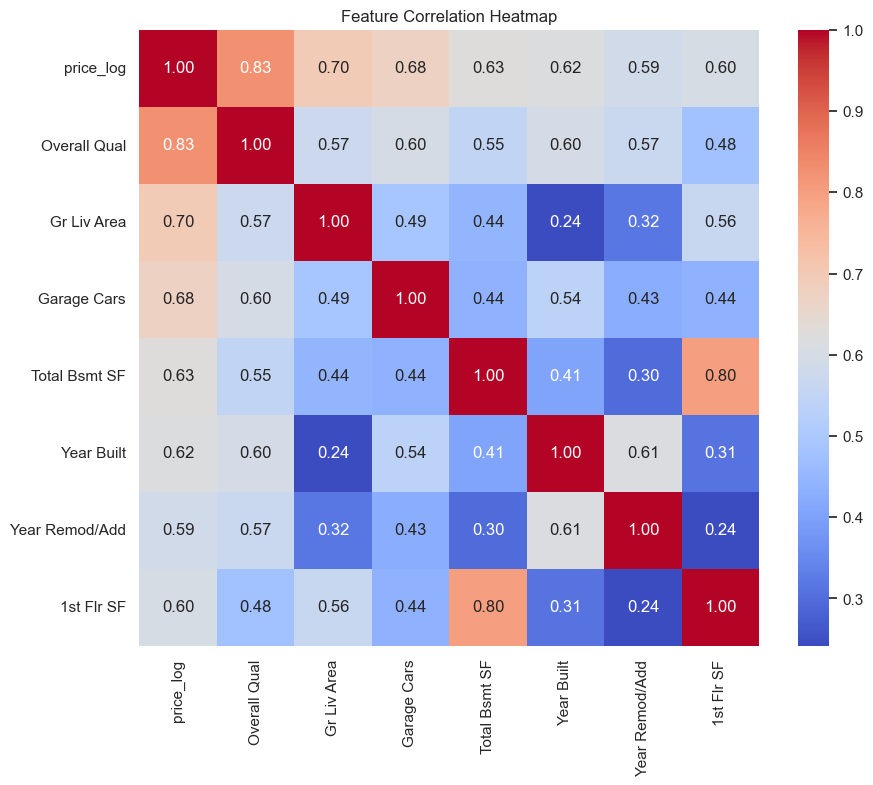

In [25]:
numeric = df_f.select_dtypes(include = ['float64','int64'])

corr_matrix = numeric.corr()
plt.figure(figsize=(10,8))

sns.heatmap(corr_matrix,annot=True,cmap='coolwarm',fmt='.2f')
plt.title('Feature Correlation Heatmap')
plt.show()

---
## Data preprocesing
---

### Duplicates Handiling
--- 

In [26]:
#Data shape 
rows,columns = df_f.shape
print(f"Rows: {rows}, Columns: {columns}")

Rows: 2930, Columns: 10


In [27]:
df_f.duplicated().sum()

np.int64(8)

In [28]:
df_f = df_f.drop_duplicates()
df_f

,price_log,Neighborhood,Bsmt Qual,Overall Qual,Gr Liv Area,Garage Cars,Total Bsmt SF,Year Built,Year Remod/Add,1st Flr SF
0,12.278398,NAmes,TA,6,1656,2.0,1080.0,1960,1960,1656
1,11.561725,NAmes,TA,5,896,1.0,882.0,1961,1961,896
2,12.055256,NAmes,TA,6,1329,1.0,1329.0,1958,1958,1329
3,12.404928,NAmes,TA,7,2110,2.0,2110.0,1968,1968,2110
4,12.154258,Gilbert,Gd,5,1629,2.0,928.0,1997,1998,928
...,...,...,...,...,...,...,...,...,...,...
2925,11.867104,Mitchel,TA,6,1003,2.0,1003.0,1984,1984,1003
2926,11.782960,Mitchel,Gd,5,902,2.0,864.0,1983,1983,902
2927,11.790565,Mitchel,Gd,5,970,0.0,912.0,1992,1992,970
2928,12.043560,Mitchel,Gd,5,1389,2.0,1389.0,1974,1975,1389


In [29]:
df_f.duplicated().sum()

np.int64(0)

In [30]:
rows,columns = df_f.shape
print(f"Rows: {rows}, Columns: {columns}")

Rows: 2922, Columns: 10


### Nulls Handiling
---

In [31]:
from sklearn.model_selection import train_test_split

# 1. SPLIT DATA FIRST to prevent Data Leakage!
y = df_f['price_log']
X = df_f.drop(columns=['price_log'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 2. Numerical features: fill with median computed ONLY on X_train
num_cols = X_train.select_dtypes(include=['float64','int64']).columns
medians = X_train[num_cols].median()
X_train[num_cols] = X_train[num_cols].fillna(medians)
X_test[num_cols]  = X_test[num_cols].fillna(medians)

X_train[num_cols].head()

,Overall Qual,Gr Liv Area,Garage Cars,Total Bsmt SF,Year Built,Year Remod/Add,1st Flr SF
2305,6,1293,2.0,1178.0,1954,1954,1293
2289,4,630,0.0,630.0,1970,1970,630
1097,7,1651,2.0,831.0,1999,1999,873
542,7,1450,3.0,1450.0,2008,2009,1450
2866,6,1801,2.0,697.0,1930,1959,1104


In [32]:
print("Nulls in Columns")
print("=="*10)
print('Showing for X_train:')
X_train.isnull().sum()

Nulls in Columns
Showing for X_train:


Neighborhood       0
Bsmt Qual         65
Overall Qual       0
Gr Liv Area        0
Garage Cars        0
Total Bsmt SF      0
Year Built         0
Year Remod/Add     0
1st Flr SF         0
dtype: int64

### Fill nulls for catigorical fetures with 'Mode'
---

In [33]:
# Shows an array of all unique text entries
X_train['Bsmt Qual'].unique()

array(['TA', 'Gd', 'Ex', 'Fa', nan, 'Po'], dtype=object)

In [34]:
# Preview the unique values in Bsmt Qual before filling nulls
X_train['Bsmt Qual'].unique()


array(['TA', 'Gd', 'Ex', 'Fa', nan, 'Po'], dtype=object)

In [35]:
# Fill nulls for categorical features using mode learned from X_train only

cat_cols = ['Neighborhood', 'Bsmt Qual']

for col in cat_cols:
    most_common = X_train[col].mode(dropna=True)[0]
    X_train[col] = X_train[col].fillna(most_common)
    X_test[col]  = X_test[col].fillna(most_common)

print("Nulls in Columns")
print("=="*10)
print('Showing for X_train:')
X_train.isnull().sum()

Nulls in Columns
Showing for X_train:


Neighborhood      0
Bsmt Qual         0
Overall Qual      0
Gr Liv Area       0
Garage Cars       0
Total Bsmt SF     0
Year Built        0
Year Remod/Add    0
1st Flr SF        0
dtype: int64

In [36]:
# Shows an array of all unique text entries
X_train['Bsmt Qual'].unique()

array(['TA', 'Gd', 'Ex', 'Fa', 'Po'], dtype=object)

### Outliers Handiling 
---

In [37]:
print(f"X_train with outliers check: {X_train.shape[0]} rows")

# Use only columns that exist in X_train (after dropping target columns)
outlier_cols = X_train.select_dtypes(include=['float64','int64']).columns

for col in outlier_cols:
    Q1 = X_train[col].quantile(0.25)
    Q3 = X_train[col].quantile(0.75)

    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    outliers = ((X_train[col] < lower) | (X_train[col] > upper)).sum()
    print(f"Found {outliers} outliers in {col}")


X_train with outliers check: 2337 rows
Found 3 outliers in Overall Qual
Found 58 outliers in Gr Liv Area
Found 9 outliers in Garage Cars
Found 98 outliers in Total Bsmt SF
Found 8 outliers in Year Built
Found 0 outliers in Year Remod/Add
Found 35 outliers in 1st Flr SF


Found 8 outliers in Year Built
Found 0 outliers in Year Remod/Add
Found 35 outliers in 1st Flr SF


In [38]:
# 2. CAPPING (For fixed/category-like ranges)
# ==========================================
cap_cols = ['Overall Qual','Gr Liv Area','Garage Cars','Total Bsmt SF','1st Flr SF']

for col in cap_cols:
    X_train[col] = X_train[col].astype(float)
    X_test[col] = X_test[col].astype(float) # ensure float to accept capped values
    
    # Calculate limits from X_train ONLY!
    lower_limit = X_train[col].quantile(0.01)
    upper_limit = X_train[col].quantile(0.99)
    
    X_train[col] = X_train[col].clip(lower=lower_limit, upper=upper_limit)
    X_test[col]  = X_test[col].clip(lower=lower_limit, upper=upper_limit)

print(" -> Columns capped at 1%/99% percentiles (learned from X_train).")

 -> Columns capped at 1%/99% percentiles (learned from X_train).


In [39]:
print("--- OUTLIER DETECTION REPORT (IQR) ---")

# Use only numeric columns that exist in X_train (targets were dropped)
outlier_cols = X_train.select_dtypes(include=['float64','int64']).columns

for col in outlier_cols:
    Q1 = X_train[col].quantile(0.25)
    Q3 = X_train[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = X_train[(X_train[col] < lower_bound) | (X_train[col] > upper_bound)]
    percent = (len(outliers) / len(X_train)) * 100

    print(f"{col}: {len(outliers)} outliers detected ({percent:.2f}% of data)")


--- OUTLIER DETECTION REPORT (IQR) ---
Overall Qual: 0 outliers detected (0.00% of data)
Gr Liv Area: 58 outliers detected (2.48% of data)
Garage Cars: 0 outliers detected (0.00% of data)
Total Bsmt SF: 98 outliers detected (4.19% of data)
Year Built: 8 outliers detected (0.34% of data)
Year Remod/Add: 0 outliers detected (0.00% of data)
1st Flr SF: 35 outliers detected (1.50% of data)


### Spliting the data
---

In [40]:
# y, X and splits were already computed above to avoid data leakage.
X_train.head()

,Neighborhood,Bsmt Qual,Overall Qual,Gr Liv Area,Garage Cars,Total Bsmt SF,Year Built,Year Remod/Add,1st Flr SF
2305,NAmes,TA,6.0,1293.0,2.0,1178.0,1954,1954,1293.0
2289,MeadowV,Gd,4.0,672.0,0.0,630.0,1970,1970,630.0
1097,Gilbert,Gd,7.0,1651.0,2.0,831.0,1999,1999,873.0
542,SawyerW,Gd,7.0,1450.0,3.0,1450.0,2008,2009,1450.0
2866,Crawfor,TA,6.0,1801.0,2.0,697.0,1930,1959,1104.0


In [41]:
# Train / Test split already occurred!
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)

X_train shape: (2337, 9)
X_test shape: (585, 9)


### One Hot Encoding 
---

In [42]:
# 1. Select your categorical columns
cat_cols = ['Neighborhood','Bsmt Qual']

# 2. Extract categories strictly from X_train
# Using pd.Categorical ensures that both Train and Test have the exact same columns after pd.get_dummies
for col in cat_cols:
    train_cats = pd.Categorical(X_train[col]).categories
    
    # Assign the exact same categories to both Train and Test
    X_train[col] = pd.Categorical(X_train[col], categories=train_cats)
    X_test[col]  = pd.Categorical(X_test[col], categories=train_cats)

# 3. Apply One-Hot Encoding
X_train = pd.get_dummies(X_train, columns=cat_cols, drop_first=True)
X_test = pd.get_dummies(X_test, columns=cat_cols, drop_first=True)

# Because we used pd.Categorical, X_test now perfectly aligns with X_train (no missing/extra columns!)
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)

X_train = X_train.fillna(0).astype(float)
X_test  = X_test.fillna(0).astype(float)

X_train shape: (2337, 38)
X_test shape: (585, 38)


### Standard Scaler
---

In [43]:
from sklearn.preprocessing import StandardScaler

# Scale only the original continuous numerical columns (not one-hot columns).
# Garage Area and Garage Yr Blt were dropped in feature selection.
base_numeric_cols = ['Overall Qual','Gr Liv Area','Garage Cars',
                     'Total Bsmt SF','Year Built','Year Remod/Add','1st Flr SF']
base_numeric_cols = [c for c in base_numeric_cols if c in X_train.columns]

# ── Save raw (unscaled) MLR features BEFORE scaling ──────────────────────────
# The Statistical View classes work on raw feature scales so that scatter-matrix
# quantities (variance, covariance) carry meaningful real-world interpretation.
mlr_features_raw = ['Overall Qual', 'Gr Liv Area', 'Garage Cars', 'Total Bsmt SF', 'Year Built']
X_mlr_train_raw = X_train[mlr_features_raw].values.astype(float)
X_mlr_test_raw  = X_test[mlr_features_raw].values.astype(float)

scaler = StandardScaler()
X_train[base_numeric_cols] = scaler.fit_transform(X_train[base_numeric_cols])
X_test[base_numeric_cols]  = scaler.transform(X_test[base_numeric_cols])

print("Trained data (First 5 rows):")
print(X_train.head())

print("\nTest data (First 5 rows):")
display(X_test.head())


Trained data (First 5 rows):
      Overall Qual  Gr Liv Area  Garage Cars  Total Bsmt SF  Year Built  \
2305     -0.075020    -0.418691     0.331254       0.327003   -0.562352   
2289     -1.521815    -1.721174    -2.385030      -1.006864   -0.034753   
1097      0.648377     0.332176     0.331254      -0.517617    0.921521   
542       0.648377    -0.089400     1.689396       0.989069    1.218296   
2866     -0.075020     0.646785     0.331254      -0.843782   -1.353751   

      Year Remod/Add  1st Flr SF  Neighborhood_Blueste  Neighborhood_BrDale  \
2305       -1.437761    0.373273                   0.0                  0.0   
2289       -0.671239   -1.437460                   0.0                  0.0   
1097        0.718081   -0.773798                   0.0                  0.0   
542         1.197157    0.802059                   0.0                  0.0   
2866       -1.198223   -0.142909                   0.0                  0.0   

      Neighborhood_BrkSide  ...  Neighborhood

,Overall Qual,Gr Liv Area,Garage Cars,Total Bsmt SF,Year Built,Year Remod/Add,1st Flr SF,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,...,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Bsmt Qual_Fa,Bsmt Qual_Gd,Bsmt Qual_Po,Bsmt Qual_TA
423,2.558146,1.907320,1.689396,2.732638,1.218296,1.149249,3.085385,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1867,0.648377,0.246183,0.331254,0.195564,0.031197,0.143190,1.239038,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1342,-1.521815,-0.747982,-1.026888,-0.826743,-1.386726,-1.629391,-1.453847,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
506,1.371775,-0.051647,1.689396,1.032882,1.218296,1.197157,0.851219,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2019,-0.075020,-0.263484,-1.026888,-0.388612,-1.320776,-1.629391,-0.538921,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [44]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score


lr_model = LinearRegression()

# 1. Train model on training data
lr_model.fit(X_train, y_train)

# 2. Get predictions
y_pred_train_log = lr_model.predict(X_train)

# 3. CRITICAL STEP: Reverse the log1p transform using expm1 to get REAL prices
y_train_real = np.expm1(y_train)
y_pred_train_real = np.expm1(y_pred_train_log)

# 4. Calculate error metrics on the REAL prices
train_mae = mean_absolute_error(y_train_real, y_pred_train_real)
train_mse = mean_squared_error(y_train_real, y_pred_train_real)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train_real, y_pred_train_real)

print("============= TRAINING SET EVALUATION =============")
print(f"Mean Absolute Error (MAE):      ${train_mae:,.2f}")
print(f"Mean Squared Error (MSE):       ${train_mse:,.2f}")
print(f"Root Mean Squared Error (RMSE): ${train_rmse:,.2f}")
print(f"R-squared (R²):                  {train_r2:.4f}")
print("=================================================\n")


============= TRAINING SET EVALUATION =============
Mean Absolute Error (MAE):      $17,835.25
Mean Squared Error (MSE):       $758,722,394.62
Root Mean Squared Error (RMSE): $27,544.92
R-squared (R²):                  0.8783



In [45]:
# 1. Ask the trained model to predict housing prices for the TEST set
y_pred_test_log = lr_model.predict(X_test)

# 2. Reverse the log transformation to get Real Prices
y_test_real = np.expm1(y_test)
y_pred_test_real = np.expm1(y_pred_test_log)

# 3. Calculate your final, true Error Metrics on the unseen Test Set
test_mae = mean_absolute_error(y_test_real, y_pred_test_real)
test_rmse = np.sqrt(mean_squared_error(y_test_real, y_pred_test_real))
test_r2 = r2_score(y_test_real, y_pred_test_real)

print("============= TEST SET EVALUATION =============")
print(f"Mean Absolute Error (MAE):      ${test_mae:,.2f}")
print(f"Root Mean Squared Error (RMSE): ${test_rmse:,.2f}")
print(f"R-squared (R²):                  {test_r2:.4f}")
print("===============================================")


============= TEST SET EVALUATION =============
Mean Absolute Error (MAE):      $17,815.83
Root Mean Squared Error (RMSE): $28,523.22
R-squared (R²):                  0.8832


---
# Model Fitting — Numerical View (Ridge & Lasso)
**Implemented from scratch using NumPy only — no sklearn for the core math.**

### Scope of this section
| # | Class | Method | Regularisation |
|---|---|---|---|
| 1 | `SimpleLinearRegressionNumericalView` | Closed-form Normal Equations | Ridge (`λ≥0`) |
| 2 | `LassoNumericalView` | Coordinate Descent + Soft-Thresholding | Lasso (`λ≥0`) |

**Dataset context**
- Target: `price_log` (log-transformed `SalePrice`)
- Best single predictor: `Overall Qual` (abs correlation ≈ 0.82 with `price_log`)
---


---
## 1 · Simple Linear Regression — Numerical View (Ridge)
*(Closed-form Normal Equations, one predictor: `Overall Qual`)*

---

### Mathematical Derivation

**Loss (Ridge-penalised SSE):**

$$\text{Loss}(a_0, a_1) = \sum_{i=1}^{n}(y_i - a_0 - a_1 x_i)^2 + n\lambda\,a_1^2$$

> Scaling by $n$ keeps the penalty strength dataset-size independent.

**Step 1 — $\partial\text{Loss}/\partial a_0 = 0$ (intercept, unpenalised):**

$$\sum y_i = n\,a_0 + a_1\sum x_i \qquad \text{(Eq. 1)}$$

**Step 2 — $\partial\text{Loss}/\partial a_1 = 0$ (slope, penalised):**

$$\sum x_i y_i = a_0\sum x_i + a_1\bigl(\sum x_i^2 + n\lambda\bigr) \qquad \text{(Eq. 2)}$$

**Step 3 — Matrix (Normal Equations):**

$$\begin{bmatrix} n & \sum x_i \\ \sum x_i & \sum x_i^2 + n\lambda \end{bmatrix}\begin{bmatrix} a_0 \\ a_1 \end{bmatrix} =\begin{bmatrix} \sum y_i \\ \sum x_i y_i \end{bmatrix}$$

Solved with `np.linalg.solve` — **no sklearn**.

In [46]:
class SimpleLinearRegressionNumericalView:
    """
    SLR solved via Ridge-penalised Normal Equations. NumPy only.
    Loss = sum(y - a0 - a1*x)^2 + n*lambda*a1^2
    lambda=0 -> OLS, lambda>0 -> Ridge
    """
    def __init__(self):
        self.a0 = self.a1 = self.SSE = self.MSE = self.R2 = self.lambda_ = None

    def fit(self, X, y, lambda_=0.0, show_steps=True):
        X = np.asarray(X, dtype=float).reshape(-1)
        y = np.asarray(y, dtype=float).reshape(-1)
        self.lambda_ = lambda_
        n   = len(X)
        Sx  = np.sum(X);   Sy  = np.sum(y)
        Sxx = np.sum(X**2); Sxy = np.sum(X*y)
        nL  = n * lambda_

        if show_steps:
            label = f"Ridge, lambda={lambda_}" if lambda_ else "OLS, lambda=0"
            print("="*55)
            print(f"  SLR Numerical View  ({label})")
            print("="*55)
            print("\nStep 1 . Loss = Sum(yi-a0-a1*xi)^2 + n*lambda*a1^2")
            print("\nStep 2 . Summations")
            print(f"  n={n}, lambda={lambda_}, n*lambda={nL:.2f}")
            print(f"  Sum(x)={Sx:.4f}, Sum(y)={Sy:.4f}")
            print(f"  Sum(x^2)={Sxx:.4f}, Sum(xy)={Sxy:.4f}")
            print("\nStep 3 . Normal Equations")
            print(f"  Eq1: {Sy:.2f} = {n}*a0 + {Sx:.2f}*a1")
            print(f"  Eq2: {Sxy:.2f} = {Sx:.2f}*a0 + ({Sxx:.2f}+{nL:.2f})*a1")
            print("\nStep 4 . Matrix Form -> solve with np.linalg.solve")
            print(f"  [[ {n}      {Sx:.2f}     ]]  [a0]   [{Sy:.2f}   ]")
            print(f"  [[ {Sx:.2f}  {Sxx+nL:.2f} ]]  [a1] = [{Sxy:.2f} ]")

        A = np.array([[n, Sx],[Sx, Sxx+nL]], dtype=float)
        b = np.array([Sy, Sxy], dtype=float)
        self.a0, self.a1 = np.linalg.solve(A, b)

        yh = self.predict(X)
        self.SSE = float(np.sum((y-yh)**2))
        self.MSE = self.SSE / (n-2)
        self.R2  = 1 - self.SSE / float(np.sum((y-y.mean())**2))

        if show_steps:
            print("\nStep 5 . Solution")
            print(f"  a0 = {self.a0:.6f}  |  a1 = {self.a1:.6f}")
            print(f"  y_hat = {self.a0:.4f} + {self.a1:.4f}*x")
            print(f"  SSE={self.SSE:.4f}  MSE={self.MSE:.4f}  R2={self.R2:.4f}")
        return self

    def predict(self, X):
        return self.a0 + self.a1*np.asarray(X, dtype=float).reshape(-1)

    def plot(self, X, y, title=None):
        X, y = np.asarray(X,float), np.asarray(y,float)
        order = np.argsort(X)
        fig, axes = plt.subplots(1, 2, figsize=(13, 4))
        # Left: scatter + regression line
        axes[0].scatter(X, y, color="steelblue", alpha=0.35, s=12, label="Data")
        axes[0].plot(X[order], self.predict(X)[order], color="crimson", lw=2,
                     label=f"y={self.a0:.3f}+{self.a1:.3f}x  (lambda={self.lambda_})")
        axes[0].set_xlabel("Overall Qual"); axes[0].set_ylabel("price_log")
        axes[0].set_title(title or "SLR Numerical View -- Regression Line")
        axes[0].legend(fontsize=8)
        # Right: residuals
        residuals = y - self.predict(X)
        axes[1].scatter(self.predict(X), residuals, color="steelblue", alpha=0.35, s=12)
        axes[1].axhline(0, color="crimson", lw=1.5, linestyle="--")
        axes[1].set_xlabel("Fitted values"); axes[1].set_ylabel("Residuals")
        axes[1].set_title("Residual Plot")
        plt.tight_layout(); plt.show()


### 1a · OLS (λ=0) — step-by-step derivation

Using `Overall Qual` (best single predictor from preprocessing) vs `price_log` from the **training set**.

> **Note on feature scaling:** By this point, `Overall Qual` has been StandardScaled (z-scored) by the preprocessing pipeline. The SLR classes receive z-scores, not the original 1–10 quality ratings. The math is identical, but the printed `x̄` and coefficients reflect the scaled space — `a0` is the predicted log-price at the mean quality level, and `a1` is the change in log-price per one standard-deviation increase in quality.


  SLR Numerical View  (OLS, lambda=0)

Step 1 . Loss = Sum(yi-a0-a1*xi)^2 + n*lambda*a1^2

Step 2 . Summations
  n=2337, lambda=0.0, n*lambda=0.00
  Sum(x)=-0.0000, Sum(y)=28090.1725
  Sum(x^2)=2337.0000, Sum(xy)=781.2306

Step 3 . Normal Equations
  Eq1: 28090.17 = 2337*a0 + -0.00*a1
  Eq2: 781.23 = -0.00*a0 + (2337.00+0.00)*a1

Step 4 . Matrix Form -> solve with np.linalg.solve
  [[ 2337      -0.00     ]]  [a0]   [28090.17   ]
  [[ -0.00  2337.00 ]]  [a1] = [781.23 ]

Step 5 . Solution
  a0 = 12.019757  |  a1 = 0.334288
  y_hat = 12.0198 + 0.3343*x
  SSE=126.7166  MSE=0.0543  R2=0.6733


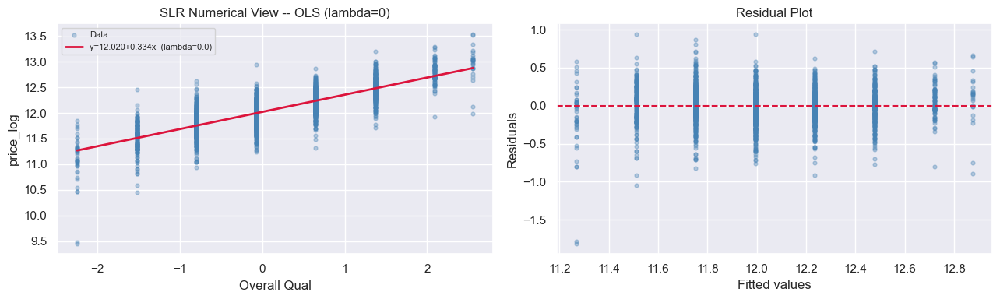

In [47]:
# NOTE: X_train['Overall Qual'] is already z-scored (StandardScaler was applied above).
# Coefficients are in scaled units: a1 = change in price_log per 1-SD increase in quality.
x_slr = X_train['Overall Qual'].values.astype(float)
y_slr = y_train.values.astype(float)

slr_ols = SimpleLinearRegressionNumericalView()
slr_ols.fit(x_slr, y_slr, lambda_=0.0, show_steps=True)
slr_ols.plot(x_slr, y_slr, title='SLR Numerical View -- OLS (lambda=0)')


### 1b · Ridge (λ=1) — step-by-step derivation

  SLR Numerical View  (Ridge, lambda=1.0)

Step 1 . Loss = Sum(yi-a0-a1*xi)^2 + n*lambda*a1^2

Step 2 . Summations
  n=2337, lambda=1.0, n*lambda=2337.00
  Sum(x)=-0.0000, Sum(y)=28090.1725
  Sum(x^2)=2337.0000, Sum(xy)=781.2306

Step 3 . Normal Equations
  Eq1: 28090.17 = 2337*a0 + -0.00*a1
  Eq2: 781.23 = -0.00*a0 + (2337.00+2337.00)*a1

Step 4 . Matrix Form -> solve with np.linalg.solve
  [[ 2337      -0.00     ]]  [a0]   [28090.17   ]
  [[ -0.00  4674.00 ]]  [a1] = [781.23 ]

Step 5 . Solution
  a0 = 12.019757  |  a1 = 0.167144
  y_hat = 12.0198 + 0.1671*x
  SSE=192.0056  MSE=0.0822  R2=0.5050


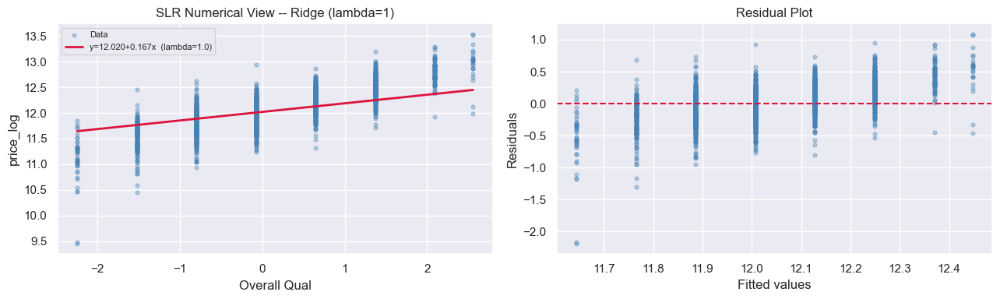

In [48]:
slr_ridge = SimpleLinearRegressionNumericalView()
slr_ridge.fit(x_slr, y_slr, lambda_=1.0, show_steps=True)
slr_ridge.plot(x_slr, y_slr, title='SLR Numerical View -- Ridge (lambda=1)')

### 1c · Effect of λ — slope shrinkage table & comparison plot

  lambda          a0          a1        R2
------------------------------------------
       0     12.0198      0.3343    0.6733
     0.5     12.0198      0.2229    0.5985
       1     12.0198      0.1671    0.5050
       5     12.0198      0.0557    0.2057
      10     12.0198      0.0304    0.1169


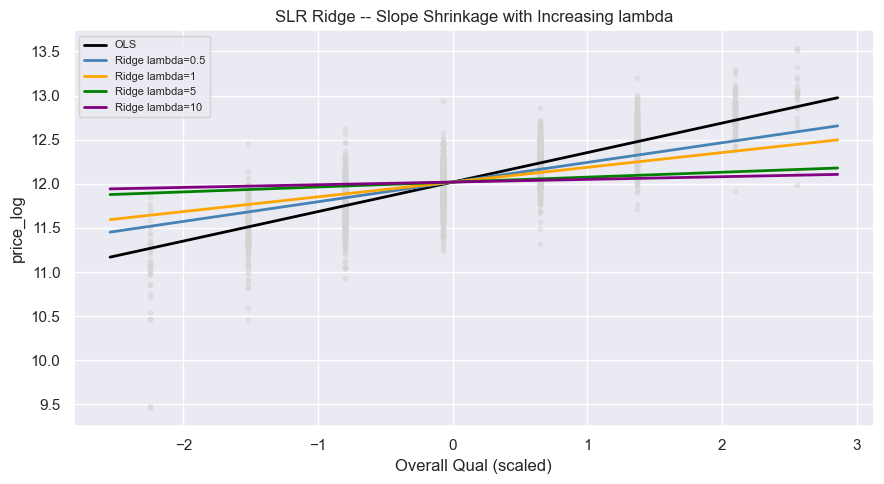

In [49]:
lambdas_r = [0, 0.5, 1, 5, 10]
colors_r  = ['black','steelblue','orange','green','purple']
x_line    = np.linspace(x_slr.min()-0.3, x_slr.max()+0.3, 300)

plt.figure(figsize=(9,5))
plt.scatter(x_slr, y_slr, color='lightgrey', alpha=0.4, s=10)

print(f"{'lambda':>8}  {'a0':>10}  {'a1':>10}  {'R2':>8}")
print('-'*42)
for lam, c in zip(lambdas_r, colors_r):
    m = SimpleLinearRegressionNumericalView()
    m.fit(x_slr, y_slr, lambda_=lam, show_steps=False)
    lbl = 'OLS' if lam==0 else f'Ridge lambda={lam}'
    plt.plot(x_line, m.predict(x_line), color=c, lw=2, label=lbl)
    print(f"{lam:>8}  {m.a0:>10.4f}  {m.a1:>10.4f}  {m.R2:>8.4f}")

plt.xlabel('Overall Qual (scaled)'); plt.ylabel('price_log')
plt.title('SLR Ridge -- Slope Shrinkage with Increasing lambda')
plt.legend(fontsize=8); plt.tight_layout(); plt.show()

### 1d · Test Set Evaluation — Class 1

After training on `x_slr` / `y_slr` (training set), we now evaluate each model on
the **held-out test set** (`X_test`) to confirm the model generalises to unseen houses.

> A small gap between Train R² and Test R² means the model is not overfitting.

In [50]:
# Extract the same single predictor from the TEST set
x_test_slr = X_test['Overall Qual'].values.astype(float)
y_test_slr  = y_test.values.astype(float)

print("=" * 54)
print("  Class 1 -- SLR Ridge  |  Test Set Evaluation")
print("=" * 54)

models_class1 = [
    ('OLS   (lambda=0)', slr_ols),
    ('Ridge (lambda=1)', slr_ridge),
]

print(f"\n{'Model':<20}  {'Train R2':>9}  {'Test R2':>9}  {'Test MSE':>10}  {'Generalises?':>13}")
print("-" * 68)

for name, m in models_class1:
    # Predict on test set
    y_pred_test = m.predict(x_test_slr)

    # Compute test metrics
    sse_test = float(np.sum((y_test_slr - y_pred_test) ** 2))
    mse_test = sse_test / (len(y_test_slr) - 2)
    r2_test  = 1 - sse_test / float(np.sum((y_test_slr - y_test_slr.mean()) ** 2))

    gap      = abs(m.R2 - r2_test)
    verdict  = "Yes" if gap < 0.05 else "Check gap"

    print(f"{name:<20}  {m.R2:>9.4f}  {r2_test:>9.4f}  {mse_test:>10.4f}  {verdict:>13}")

print("\nNote: Train R2 and Test R2 are close because SLR with one feature")
print("      has very low risk of overfitting.")


  Class 1 -- SLR Ridge  |  Test Set Evaluation

Model                  Train R2    Test R2    Test MSE   Generalises?
--------------------------------------------------------------------
OLS   (lambda=0)         0.6733     0.6711      0.0548            Yes
Ridge (lambda=1)         0.5050     0.5020      0.0829            Yes

Note: Train R2 and Test R2 are close because SLR with one feature
      has very low risk of overfitting.


---
## 2 · Simple Linear Regression — Lasso Subgradient Descent View
*(Gradient Descent with subgradient of |a₁|, one predictor: `Overall Qual`)*

---

### What is a Subgradient?

The Lasso penalty $\lambda|a_1|$ is **not differentiable at $a_1 = 0$** — it has a sharp V-shape corner there.  
A **subgradient** generalises the derivative to handle this non-smooth point:

$$\frac{\partial |a_1|}{\partial a_1} = \text{sign}(a_1) = \begin{cases} +1 & a_1 > 0 \\ 0 & a_1 = 0 \\ -1 & a_1 < 0 \end{cases}$$

At the corner $a_1 = 0$ we use $0$ — no push is applied and the coefficient stays at zero.

---

### Mathematical Derivation

**Loss function:**

$$\text{Loss}(a_0, a_1) = \frac{1}{n}\sum_{i=1}^{n}(y_i - a_0 - a_1 x_i)^2 + \lambda|a_1|$$

**Subgradients** — partial derivative of MSE plus subgradient of the penalty:

$$\frac{\partial L}{\partial a_0} = \frac{-2}{n}\sum_{i=1}^{n}(y_i - \hat{y}_i) \qquad \text{(intercept — no penalty)}$$

$$\frac{\partial L}{\partial a_1} = \frac{-2}{n}\sum_{i=1}^{n}(y_i - \hat{y}_i)\cdot x_i \;+\; \lambda\cdot\text{sign}(a_1) \qquad \text{(slope — Lasso subgradient)}$$

> $\lambda\cdot\text{sign}(a_1)$ is a **fixed-magnitude push** toward zero.  
> Ridge adds $2\lambda a_1$ (proportional to size). Lasso adds $\pm\lambda$ (constant).

**Update rule** each epoch:

$$a_0 \leftarrow a_0 - \alpha \cdot \frac{\partial L}{\partial a_0}$$

$$a_1 \leftarrow a_1 - \alpha \cdot \frac{\partial L}{\partial a_1}$$

**Early stopping condition:**

$$|\text{SSE}_{t-1} - \text{SSE}_t| < \varepsilon \qquad (\varepsilon = 10^{-9})$$

In [51]:
class LassoNumericalView:
    """
    SLR solved with Subgradient Descent for Lasso. NumPy only.
    (Replaces the previous Coordinate Descent implementation)

    Loss = (1/n)*sum(y - a0 - a1*x)^2  +  lambda*|a1|

    Subgradients:
        dL/da0 = (-2/n) * sum(error)                   [no penalty]
        dL/da1 = (-2/n) * sum(error*x) + lambda*sign(a1)  [Lasso]

    Update rule:
        a0 <- a0 - alpha * dL/da0
        a1 <- a1 - alpha * dL/da1
    """

    def __init__(self):
        self.a0           = None
        self.a1           = None
        self.SSE          = None
        self.MSE          = None
        self.R2           = None
        self.lambda_      = None
        self.loss_history = []   # SSE per epoch — used for convergence plot

    def fit(self, X, y, lambda_=0.0, learning_rate=0.01,
            epochs=10000, tolerance=1e-9, show_steps=True):
        """
        Parameters
        ----------
        X             : array-like  — single predictor (Overall Qual scaled)
        y             : array-like  — target (price_log)
        lambda_       : float       — Lasso penalty strength  (0 = OLS)
        learning_rate : float       — step size alpha
        epochs        : int         — maximum iterations
        tolerance     : float       — early-stop threshold on |delta SSE|
        show_steps    : bool        — print training summary
        """
        X = np.asarray(X, dtype=float).reshape(-1)
        y = np.asarray(y, dtype=float).reshape(-1)
        n = len(X)
        self.lambda_      = lambda_
        self.loss_history = []

        # Initialise both coefficients to zero
        self.a0  = 0.0
        self.a1  = 0.0
        prev_sse = float("inf")

        if show_steps:
            label = f"Lasso (lambda={lambda_})" if lambda_ != 0 else "OLS (lambda=0)"
            print("=" * 55)
            print(f"  SLR Lasso Subgradient Descent View  --  {label}")
            print("=" * 55)
            print("\nLoss = (1/n)*Sum(yi - a0 - a1*xi)^2  +  lambda*|a1|")
            print("\nSubgradients:")
            print("  dL/da0 = (-2/n)*sum(error)                  [no penalty]")
            print("  dL/da1 = (-2/n)*sum(error*x) + lambda*sign(a1)  [Lasso]")
            print("\nUpdate rule:  a <- a - alpha * gradient")
            print(f"  alpha   = {learning_rate}")
            print(f"  lambda  = {lambda_}")
            print(f"  n       = {n}\n")

        for epoch in range(1, epochs + 1):

            # a) Predicted values and residuals
            y_hat = self.a0 + self.a1 * X
            error = y - y_hat

            # b) Subgradients
            #    dL/da0 = (-2/n)*sum(error)               [intercept — no penalty]
            #    dL/da1 = (-2/n)*sum(error*x) + lambda*sign(a1)  [Lasso subgradient]
            dL_da0 = (-2.0 / n) * np.sum(error)
            dL_da1 = (-2.0 / n) * np.sum(error * X) + lambda_ * np.sign(self.a1)

            # c) Update:  a <- a - alpha * gradient
            self.a0 -= learning_rate * dL_da0
            self.a1 -= learning_rate * dL_da1

            # d) Divergence guard
            if not (np.isfinite(self.a0) and np.isfinite(self.a1)):
                if show_steps:
                    print(f"  Divergence at epoch {epoch}. Try a smaller learning_rate.")
                self.a0, self.a1 = float("nan"), float("nan")
                self.loss_history = []
                return self

            # e) Track SSE for convergence plot
            curr_sse = float(np.sum((y - (self.a0 + self.a1 * X)) ** 2))
            self.loss_history.append(curr_sse)

            # f) Early stopping
            if abs(prev_sse - curr_sse) < tolerance:
                if show_steps:
                    print(f"  Early stop at epoch {epoch}  "
                          f"(|delta SSE| = {abs(prev_sse - curr_sse):.2e})")
                break
            prev_sse = curr_sse

        # Final metrics
        y_hat    = self.predict(X)
        self.SSE = float(np.sum((y - y_hat) ** 2))
        self.MSE = self.SSE / (n - 2)
        ss_tot   = float(np.sum((y - y.mean()) ** 2))
        self.R2  = 1.0 - self.SSE / ss_tot

        if show_steps:
            print(f"\na0 (intercept) = {self.a0:.6f}")
            print(f"a1 (slope)     = {self.a1:.6f}")
            print(f"y_hat = {self.a0:.4f} + {self.a1:.4f} * x")
            print(f"SSE   = {self.SSE:.4f}")
            print(f"MSE   = {self.MSE:.4f}")
            print(f"R2    = {self.R2:.4f}")
        return self

    def predict(self, X):
        """Return predicted values for input X."""
        if self.a0 is None:
            raise ValueError("Model not fitted yet.")
        return self.a0 + self.a1 * np.asarray(X, dtype=float).reshape(-1)

    def plot(self, X, y, title=None):
        """Scatter + regression line (left) and convergence curve (right)."""
        X, y  = np.asarray(X, float), np.asarray(y, float)
        order = np.argsort(X)
        fig, axes = plt.subplots(1, 2, figsize=(13, 4))
        # Left: regression line
        axes[0].scatter(X, y, color="steelblue", alpha=0.35, s=12, label="Data")
        axes[0].plot(X[order], self.predict(X)[order], color="tomato", lw=2,
                     label=f"y={self.a0:.3f}+{self.a1:.3f}x  (lambda={self.lambda_})")
        axes[0].set_xlabel("Overall Qual (scaled)")
        axes[0].set_ylabel("price_log")
        axes[0].set_title(title or "Lasso Subgradient View -- Regression Line")
        axes[0].legend(fontsize=8)
        # Right: convergence curve
        if self.loss_history:
            axes[1].plot(self.loss_history, color="tomato", lw=1.5)
        axes[1].set_xlabel("Epoch")
        axes[1].set_ylabel("SSE (Loss)")
        axes[1].set_title(f"Subgradient Convergence  (lambda={self.lambda_})")
        plt.tight_layout()
        plt.show()


### 2a · OLS (λ=0) — subgradient with no penalty

  SLR Lasso Subgradient Descent View  --  OLS (lambda=0)

Loss = (1/n)*Sum(yi - a0 - a1*xi)^2  +  lambda*|a1|

Subgradients:
  dL/da0 = (-2/n)*sum(error)                  [no penalty]
  dL/da1 = (-2/n)*sum(error*x) + lambda*sign(a1)  [Lasso]

Update rule:  a <- a - alpha * gradient
  alpha   = 0.01
  lambda  = 0.0
  n       = 2337

  Early stop at epoch 750  (|delta SSE| = 9.62e-10)

a0 (intercept) = 12.019754
a1 (slope)     = 0.334288
y_hat = 12.0198 + 0.3343 * x
SSE   = 126.7166
MSE   = 0.0543
R2    = 0.6733


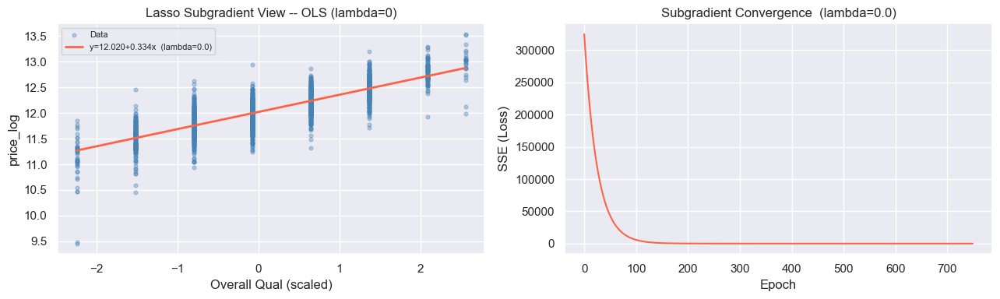

In [52]:
lasso_ols = LassoNumericalView()
lasso_ols.fit(x_slr, y_slr, lambda_=0.0,
              learning_rate=0.01, epochs=10000, show_steps=True)
lasso_ols.plot(x_slr, y_slr, title='Lasso Subgradient View -- OLS (lambda=0)')

### 2b · Lasso (λ=0.1) — subgradient with Lasso penalty active

  SLR Lasso Subgradient Descent View  --  Lasso (lambda=0.1)

Loss = (1/n)*Sum(yi - a0 - a1*xi)^2  +  lambda*|a1|

Subgradients:
  dL/da0 = (-2/n)*sum(error)                  [no penalty]
  dL/da1 = (-2/n)*sum(error*x) + lambda*sign(a1)  [Lasso]

Update rule:  a <- a - alpha * gradient
  alpha   = 0.01
  lambda  = 0.1
  n       = 2337

  Early stop at epoch 1041  (|delta SSE| = 9.93e-10)

a0 (intercept) = 12.019757
a1 (slope)     = 0.284288
y_hat = 12.0198 + 0.2843 * x
SSE   = 132.5591
MSE   = 0.0568
R2    = 0.6582


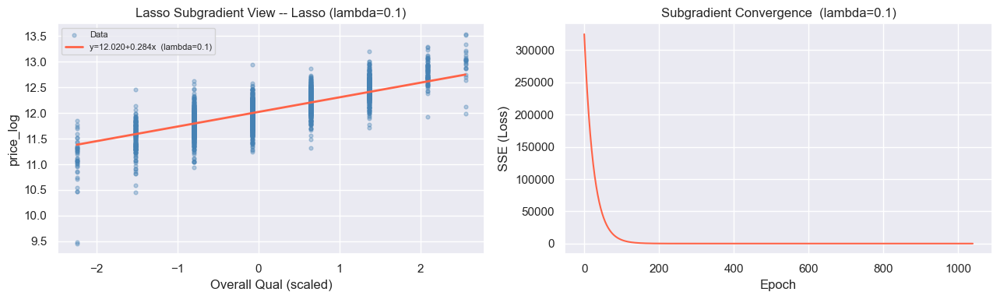

In [53]:
lasso_l01 = LassoNumericalView()
lasso_l01.fit(x_slr, y_slr, lambda_=0.1,
              learning_rate=0.01, epochs=10000, show_steps=True)
lasso_l01.plot(x_slr, y_slr, title='Lasso Subgradient View -- Lasso (lambda=0.1)')

### 2c · Effect of λ — regression lines and convergence side-by-side

  lambda          a0          a1        R2    Epochs
------------------------------------------------------
       0     12.0198      0.3343    0.6733       750
    0.01     12.0198      0.3293    0.6732       935
     0.1     12.0198      0.2843    0.6582      1041
     0.5     12.0198      0.0843    0.2967      1058


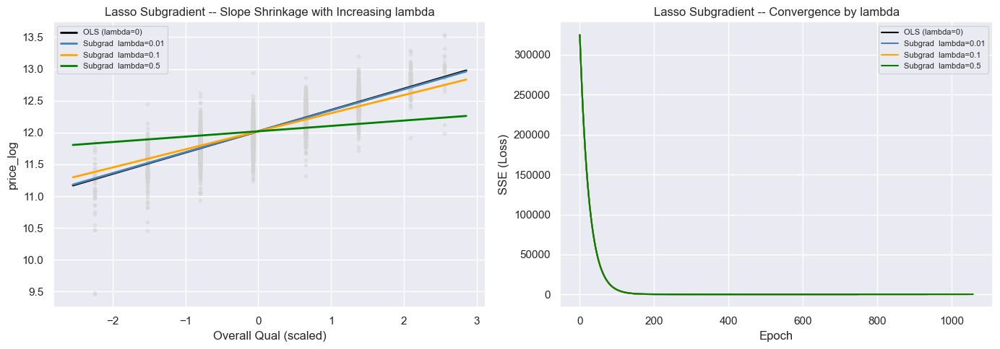

In [54]:
lambdas_l = [0, 0.01, 0.1, 0.5]
colors_l  = ['black', 'steelblue', 'orange', 'green']
x_line    = np.linspace(x_slr.min() - 0.3, x_slr.max() + 0.3, 300)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].scatter(x_slr, y_slr, color='lightgrey', alpha=0.4, s=10)

print(f"{'lambda':>8}  {'a0':>10}  {'a1':>10}  {'R2':>8}  {'Epochs':>8}")
print('-' * 54)

for lam, c in zip(lambdas_l, colors_l):
    m = LassoNumericalView()
    m.fit(x_slr, y_slr, lambda_=lam, learning_rate=0.01,
          epochs=10000, show_steps=False)
    lbl = 'OLS (lambda=0)' if lam == 0 else f'Subgrad  lambda={lam}'
    axes[0].plot(x_line, m.predict(x_line), color=c, lw=2, label=lbl)
    if m.loss_history:
        axes[1].plot(m.loss_history, color=c, lw=1.5, label=lbl)
    print(f"{lam:>8}  {m.a0:>10.4f}  {m.a1:>10.4f}  "
          f"{m.R2:>8.4f}  {len(m.loss_history):>8}")

axes[0].set_xlabel('Overall Qual (scaled)')
axes[0].set_ylabel('price_log')
axes[0].set_title('Lasso Subgradient -- Slope Shrinkage with Increasing lambda')
axes[0].legend(fontsize=8)
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('SSE (Loss)')
axes[1].set_title('Lasso Subgradient -- Convergence by lambda')
axes[1].legend(fontsize=8)
plt.tight_layout()
plt.show()

### 2d · Test Set Evaluation — Class 2

Same evaluation as Class 1 but for the Lasso models.

> If Lasso Test R² ≥ OLS Test R², the penalty helped generalisation.
> If Lasso Test R² < OLS Test R², the penalty was too strong.

In [55]:
print("=" * 54)
print("  Class 2 -- SLR Lasso  |  Test Set Evaluation")
print("=" * 54)

models_class2 = [
    ('OLS    (lambda=0)',   lasso_ols),
    ('Lasso  (lambda=0.1)', lasso_l01),
]

print(f"\n{'Model':<22}  {'Train R2':>9}  {'Test R2':>9}  {'Test MSE':>10}  {'Generalises?':>13}")
print("-" * 70)

for name, m in models_class2:
    y_pred_test = m.predict(x_test_slr)

    sse_test = float(np.sum((y_test_slr - y_pred_test) ** 2))
    mse_test = sse_test / (len(y_test_slr) - 2)
    r2_test  = 1 - sse_test / float(np.sum((y_test_slr - y_test_slr.mean()) ** 2))

    gap     = abs(m.R2 - r2_test)
    verdict = "Yes" if gap < 0.05 else "Check gap"

    print(f"{name:<22}  {m.R2:>9.4f}  {r2_test:>9.4f}  {mse_test:>10.4f}  {verdict:>13}")

print("\nNote: x_test_slr is the same Overall Qual test slice used for Class 1.")


  Class 2 -- SLR Lasso  |  Test Set Evaluation

Model                    Train R2    Test R2    Test MSE   Generalises?
----------------------------------------------------------------------
OLS    (lambda=0)          0.6733     0.6711      0.0548            Yes
Lasso  (lambda=0.1)        0.6582     0.6555      0.0574            Yes

Note: x_test_slr is the same Overall Qual test slice used for Class 1.


### Combined Summary — Class 1 vs Class 2 on Test Set

Side-by-side comparison of all models from both classes on the test set.

In [56]:
print("=" * 66)
print("  All Models -- Test Set Comparison (Overall Qual → price_log)")
print("=" * 66)

all_models = [
    ('Class 1 | OLS   (lambda=0)',   slr_ols),
    ('Class 1 | Ridge (lambda=1)',   slr_ridge),
    ('Class 2 | OLS   (lambda=0)',   lasso_ols),
    ('Class 2 | Lasso (lambda=0.1)', lasso_l01),
]

print(f"\n{'Model':<32}  {'Train R2':>9}  {'Test R2':>9}  {'Test MSE':>10}")
print("-" * 66)

for name, m in all_models:
    y_pred_test = m.predict(x_test_slr)
    sse_test = float(np.sum((y_test_slr - y_pred_test) ** 2))
    mse_test = sse_test / (len(y_test_slr) - 2)
    r2_test  = 1 - sse_test / float(np.sum((y_test_slr - y_test_slr.mean()) ** 2))
    print(f"{name:<32}  {m.R2:>9.4f}  {r2_test:>9.4f}  {mse_test:>10.4f}")


  All Models -- Test Set Comparison (Overall Qual → price_log)

Model                              Train R2    Test R2    Test MSE
------------------------------------------------------------------
Class 1 | OLS   (lambda=0)           0.6733     0.6711      0.0548
Class 1 | Ridge (lambda=1)           0.5050     0.5020      0.0829
Class 2 | OLS   (lambda=0)           0.6733     0.6711      0.0548
Class 2 | Lasso (lambda=0.1)         0.6582     0.6555      0.0574


---
# Simple Linear Regression — Statistical View (OLS, Ridge, Lasso)
**Implemented from scratch using NumPy only — no sklearn for the core math.**

This section mirrors the **Numerical View** (Normal Equations / Coordinate Descent), but derives the same estimators using *statistical (scatter / covariance) quantities*.

---

## 1) OLS (no regularisation)
Let:

- $\bar{x} = \frac{1}{n}\sum_{i=1}^n x_i$,
- $\bar{y} = \frac{1}{n}\sum_{i=1}^n y_i$,
- $S_{XX} = \sum x_i^2 - n\bar{x}^2$,
- $S_{XY} = \sum x_i y_i - n\bar{x}\bar{y}$.

Then the *OLS* line of best fit is:

$$B_1 = \frac{S_{XY}}{S_{XX}},\qquad B_0 = \bar{y} - B_1\bar{x}$$

---

## 2) Ridge Regression (Statistical View)
Ridge shrinks the slope by inflating the variance term in the denominator:

$$B_1^{\text{ridge}} = \frac{S_{XY}}{S_{XX} + n\lambda},\qquad B_0 = \bar{y} - B_1^{\text{ridge}}\bar{x}$$

- $\lambda=0$ gives OLS.
- Larger $\lambda$ makes $B_1$ smaller in magnitude (less variance, more bias).

---

## 3) Lasso Regression (Statistical View)
For Lasso, the penalty is $\lambda |B_1|$, which is **not differentiable at 0**, so there is no single closed-form Normal-Equation solution.

We solve it using **Coordinate Descent** with **Soft-Thresholding**:

$$\mathcal{S}(z,t)=\operatorname{sign}(z)\,\max(|z|-t,0)$$

Using the 1D update form (cycling until convergence):

$$B_0 \leftarrow \overline{(y - B_1 x)}\qquad\qquad
B_1 \leftarrow \frac{\mathcal{S}(\rho,\lambda/2)}{S_{xx}}$$

where

$$\rho = \frac{1}{n}\sum x_i (y_i - B_0),\qquad S_{xx} = \frac{1}{n}\sum x_i^2$$

If $|\rho|\le \lambda/2$ then $B_1=0$ (Lasso sparsity).

---

In [57]:
class SimpleLinearRegressionStatisticalView:
    """ 
    Simple Linear Regression (Statistical View) with optional Ridge penalty.

    OLS:
        B1 = SXY / SXX
        B0 = y_bar - B1*x_bar

    Ridge:
        B1 = SXY / (SXX + n*lambda)
        B0 = y_bar - B1*x_bar

    Notes:
    - Uses scatter quantities SXX, SXY.
    - Intercept is not penalised.
    - lambda=0 -> OLS.
    """
    def __init__(self):
        self.B_0 = None
        self.B_1 = None
        self.SSE = None
        self.MSE = None
        self.R2 = None
        self.lambda_ = None

    def fit(self, X, y, lambda_=0.0, show_steps=True):
        X = np.asarray(X, dtype=float).reshape(-1)
        y = np.asarray(y, dtype=float).reshape(-1)
        n = len(X)
        self.lambda_ = float(lambda_)

        x_bar = float(X.mean())
        y_bar = float(y.mean())

        SXX = float(np.sum(X**2) - n * (x_bar**2))
        SXY = float(np.sum(X * y) - n * x_bar * y_bar)

        denom = SXX + n * self.lambda_
        if denom == 0:
            raise ValueError("SXX + n*lambda is zero; cannot fit model.")

        self.B_1 = SXY / denom
        self.B_0 = y_bar - self.B_1 * x_bar

        y_hat = self.predict(X)
        e = y - y_hat
        self.SSE = float(np.sum(e**2))
        self.MSE = self.SSE / (n - 2)
        self.R2 = 1 - self.SSE / float(np.sum((y - y_bar) ** 2))

        if show_steps:
            label = "OLS" if self.lambda_ == 0 else f"Ridge (lambda={self.lambda_})"
            print("=" * 62)
            print(f"  SLR Statistical View  |  {label}")
            print("=" * 62)
            print(f"n={n}")
            print(f"x_bar={x_bar:.6f}  y_bar={y_bar:.6f}")
            print(f"SXX={SXX:.6f}  SXY={SXY:.6f}")
            if self.lambda_ != 0:
                print(f"SXX + n*lambda = {SXX:.6f} + {n}*{self.lambda_:.6f} = {denom:.6f}")
            print(f"B_1={self.B_1:.6f}  B_0={self.B_0:.6f}")
            print(f"SSE={self.SSE:.6f}  MSE={self.MSE:.6f}  R2={self.R2:.6f}")
        return self

    def predict(self, X):
        if self.B_0 is None or self.B_1 is None:
            raise ValueError("The model has not been fitted yet.")
        X = np.asarray(X, dtype=float).reshape(-1)
        return self.B_0 + self.B_1 * X

    def plot(self, X, y, title=None):
        if self.B_0 is None or self.B_1 is None:
            raise ValueError("The model has not been fitted yet.")
        X = np.asarray(X, dtype=float).reshape(-1)
        y = np.asarray(y, dtype=float).reshape(-1)

        order = np.argsort(X)
        y_pred = self.predict(X)

        fig, axes = plt.subplots(1, 2, figsize=(13, 4))

        axes[0].scatter(X, y, color='steelblue', alpha=0.35, s=12, label='Data points')
        axes[0].plot(X[order], y_pred[order], color='crimson', lw=2, label='Regression line')
        axes[0].set_xlabel('X')
        axes[0].set_ylabel('y')
        axes[0].set_title(title or f"SLR Statistical View: y = {self.B_0:.3f} + {self.B_1:.3f} x")
        axes[0].legend(fontsize=8)

        residuals = y - y_pred
        axes[1].scatter(y_pred, residuals, color='steelblue', alpha=0.35, s=12)
        axes[1].axhline(0, color='crimson', lw=1.5, linestyle='--')
        axes[1].set_xlabel('Fitted values')
        axes[1].set_ylabel('Residuals')
        axes[1].set_title('Residual Plot')

        plt.tight_layout()
        plt.show()


class LassoSLRStatisticalView:
    """ 
    Simple Linear Regression with Lasso penalty solved by Coordinate Descent.

    Loss:
        (1/n) * sum(yi - B0 - B1*xi)^2 + lambda*|B1|

    Updates:
        B0  <- mean(y - B1*x)
        rho <- mean(x*(y - B0))
        B1  <- S(rho, lambda/2) / Sxx

    where S is soft-thresholding and Sxx = mean(x^2).
    """
    def __init__(self):
        self.B_0 = None
        self.B_1 = None
        self.SSE = None
        self.MSE = None
        self.R2 = None
        self.lambda_ = None
        self.loss_history = []

    @staticmethod
    def _soft_threshold(z, t):
        return np.sign(z) * np.maximum(np.abs(z) - t, 0.0)

    def fit(self, X, y, lambda_=0.0, max_iter=10000, tol=1e-10, show_steps=True):
        X = np.asarray(X, dtype=float).reshape(-1)
        y = np.asarray(y, dtype=float).reshape(-1)
        n = len(X)
        self.lambda_ = float(lambda_)
        self.loss_history = []

        Sxx = float(np.mean(X**2))
        if Sxx == 0:
            raise ValueError("Sxx is zero; cannot fit model.")

        self.B_0 = 0.0
        self.B_1 = 0.0

        if show_steps:
            label = "OLS" if self.lambda_ == 0 else f"Lasso (lambda={self.lambda_})"
            print("=" * 62)
            print(f"  SLR Statistical View  |  {label}")
            print("=" * 62)
            print(f"n={n}  Sxx=mean(x^2)={Sxx:.6f}")
            print("Updates:")
            print("  B0  <- mean(y - B1*x)")
            print("  rho <- mean(x*(y - B0))")
            print("  B1  <- S(rho, lambda/2) / Sxx")
            print(f"tol={tol}  max_iter={max_iter}")

        rho = None
        for it in range(1, max_iter + 1):
            B0_new = float(np.mean(y - self.B_1 * X))
            rho = float(np.mean(X * (y - B0_new)))
            B1_new = self._soft_threshold(rho, self.lambda_ / 2.0) / Sxx

            loss = float(np.mean((y - B0_new - B1_new * X) ** 2)) + self.lambda_ * abs(B1_new)
            self.loss_history.append(loss)

            d0 = abs(B0_new - self.B_0)
            d1 = abs(B1_new - self.B_1)
            self.B_0, self.B_1 = B0_new, B1_new

            if d0 < tol and d1 < tol:
                if show_steps:
                    print(f"Converged at iteration {it} (max|delta|={max(d0, d1):.2e})")
                break

        y_hat = self.predict(X)
        e = y - y_hat
        self.SSE = float(np.sum(e ** 2))
        self.MSE = self.SSE / (n - 2)
        y_bar = float(y.mean())
        self.R2 = 1 - self.SSE / float(np.sum((y - y_bar) ** 2))

        if show_steps:
            print(f"rho(last)={float(rho):.6f}")
            print(f"B_1={self.B_1:.6f}  B_0={self.B_0:.6f}")
            print(f"SSE={self.SSE:.6f}  MSE={self.MSE:.6f}  R2={self.R2:.6f}")

        return self

    def predict(self, X):
        if self.B_0 is None or self.B_1 is None:
            raise ValueError("The model has not been fitted yet.")
        X = np.asarray(X, dtype=float).reshape(-1)
        return self.B_0 + self.B_1 * X

    def plot(self, X, y, title=None):
        if self.B_0 is None or self.B_1 is None:
            raise ValueError("The model has not been fitted yet.")
        X = np.asarray(X, dtype=float).reshape(-1)
        y = np.asarray(y, dtype=float).reshape(-1)

        order = np.argsort(X)
        y_pred = self.predict(X)

        fig, axes = plt.subplots(1, 2, figsize=(13, 4))

        axes[0].scatter(X, y, color='steelblue', alpha=0.35, s=12, label='Data points')
        axes[0].plot(X[order], y_pred[order], color='darkorchid', lw=2, label='Regression line')
        axes[0].set_xlabel('X')
        axes[0].set_ylabel('y')
        axes[0].set_title(title or f"SLR Lasso Statistical View: y = {self.B_0:.3f} + {self.B_1:.3f} x")
        axes[0].legend(fontsize=8)

        axes[1].plot(self.loss_history, color='darkorchid', lw=1.5)
        axes[1].set_xlabel('Iteration')
        axes[1].set_ylabel('Penalised MSE Loss')
        axes[1].set_title('Coordinate Descent Convergence')

        plt.tight_layout()
        plt.show()


### Demo — SLR Statistical View on `Overall Qual` vs `price_log`

We reuse the exact same `x_slr` and `y_slr` you used above (training set):
- `x_slr = X_train['Overall Qual']`
- `y_slr = y_train`

This lets you compare:
- Numerical View vs Statistical View (they should match for OLS/Ridge)
- Ridge shrinkage vs Lasso sparsity


  SLR Statistical View  |  OLS
n=2337
x_bar=-0.000000  y_bar=12.019757
SXX=2337.000000  SXY=781.230643
B_1=0.334288  B_0=12.019757
SSE=126.716602  MSE=0.054268  R2=0.673303


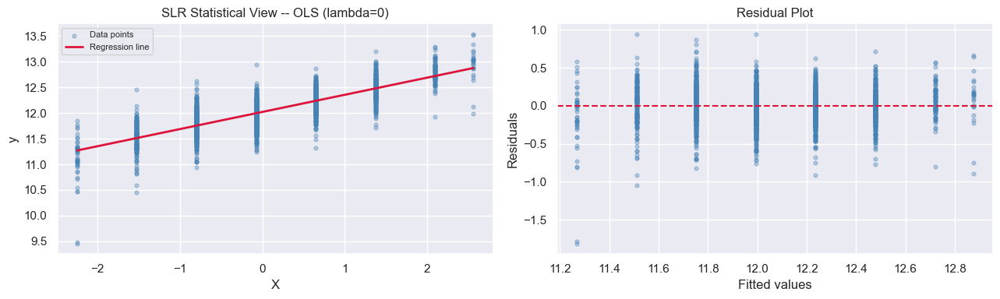

  SLR Statistical View  |  Ridge (lambda=1.0)
n=2337
x_bar=-0.000000  y_bar=12.019757
SXX=2337.000000  SXY=781.230643
SXX + n*lambda = 2337.000000 + 2337*1.000000 = 4674.000000
B_1=0.167144  B_0=12.019757
SSE=192.005575  MSE=0.082229  R2=0.504978


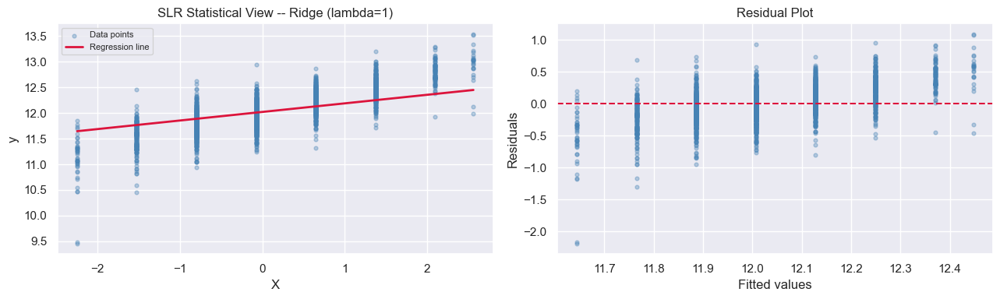

  SLR Statistical View  |  Lasso (lambda=0.1)
n=2337  Sxx=mean(x^2)=1.000000
Updates:
  B0  <- mean(y - B1*x)
  rho <- mean(x*(y - B0))
  B1  <- S(rho, lambda/2) / Sxx
tol=1e-10  max_iter=10000
Converged at iteration 2 (max|delta|=0.00e+00)
rho(last)=0.334288
B_1=0.284288  B_0=12.019757
SSE=132.559102  MSE=0.056770  R2=0.658241


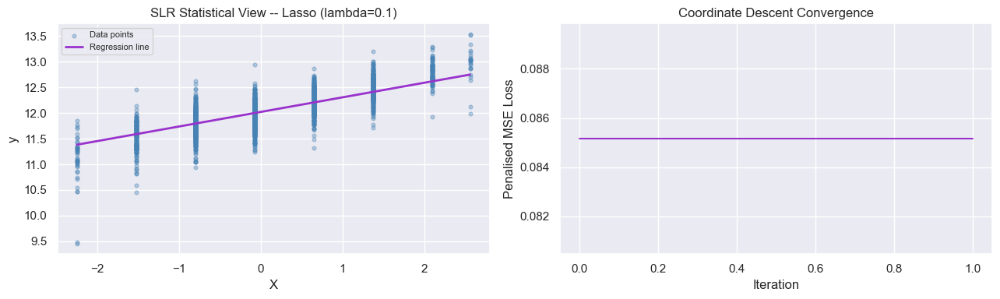


Summary (Train):
OLS   : B0=12.019757  B1=0.334288  R2=0.673303
Ridge : B0=12.019757  B1=0.167144  R2=0.504978
Lasso : B0=12.019757  B1=0.284288  R2=0.658241


In [58]:
# OLS (Statistical View)
slr_stat_ols = SimpleLinearRegressionStatisticalView()
slr_stat_ols.fit(x_slr, y_slr, lambda_=0.0, show_steps=True)
slr_stat_ols.plot(x_slr, y_slr, title='SLR Statistical View -- OLS (lambda=0)')

# Ridge (Statistical View)
slr_stat_ridge = SimpleLinearRegressionStatisticalView()
slr_stat_ridge.fit(x_slr, y_slr, lambda_=1.0, show_steps=True)
slr_stat_ridge.plot(x_slr, y_slr, title='SLR Statistical View -- Ridge (lambda=1)')

# Lasso (Statistical View)
slr_stat_lasso = LassoSLRStatisticalView()
slr_stat_lasso.fit(x_slr, y_slr, lambda_=0.1, show_steps=True)
slr_stat_lasso.plot(x_slr, y_slr, title='SLR Statistical View -- Lasso (lambda=0.1)')

print("\nSummary (Train):")
print(f"OLS   : B0={slr_stat_ols.B_0:.6f}  B1={slr_stat_ols.B_1:.6f}  R2={slr_stat_ols.R2:.6f}")
print(f"Ridge : B0={slr_stat_ridge.B_0:.6f}  B1={slr_stat_ridge.B_1:.6f}  R2={slr_stat_ridge.R2:.6f}")
print(f"Lasso : B0={slr_stat_lasso.B_0:.6f}  B1={slr_stat_lasso.B_1:.6f}  R2={slr_stat_lasso.R2:.6f}")


---
# Model Fitting — Statistical View (Ridge & Lasso)
**Implemented from scratch using NumPy only — no sklearn for the core math.**

### Scope of this section
| # | Class | Method | Regularisation |
|---|---|---|---|
| 1 | `MultiLinearRegressionStatisticalView` | Closed-form Scatter-Matrix Normal Equations | Ridge (`λ≥0`) |
| 2 | `LassoMLRStatisticalView` | Coordinate Descent + Soft-Thresholding | Lasso (`λ≥0`) |

**Dataset context**
- Target: `price_log`
- Predictors: `Overall Qual`, `Gr Liv Area`, `Garage Cars`, `Total Bsmt SF`, `Year Built`
---

> **Escalation note:** The Numerical View section (above) covered **Simple Linear Regression** (SLR) with one predictor (`Overall Qual`). This Statistical View section moves to **Multiple Linear Regression** (MLR) with 5 predictors. The scatter-matrix formulation naturally extends to $p$ predictors by replacing the scalar $S_{XX}$ with a $p\times p$ matrix — this is the key advantage of the statistical representation.


---
## 1 · Multiple Linear Regression — Statistical View (Ridge)
*(Scatter-Matrix Normal Equations, p predictors)*

---

### From SLR to MLR — Generalising the Statistical Formula

In SLR, the statistical formulas for the slope and intercept are:

$$B_1 = \frac{S_{XY}}{S_{XX}}, \qquad B_0 = \bar{y} - B_1\,\bar{x}$$

where:

$$S_{XX} = \sum x_i^2 - n\bar{x}^2 \quad (\text{variance of X, scaled by }n)$$
$$S_{XY} = \sum x_i y_i - n\bar{x}\bar{y} \quad (\text{covariance of X and Y, scaled by }n)$$

For **Multiple Linear Regression** with $p$ predictors we replace these scalars with **matrices and vectors**:

| SLR scalar | MLR matrix analogue |
|---|---|
| $S_{XX}$ | $\mathbf{S}_{XX} = \mathbf{X}^\top\mathbf{X} - n\,\bar{\mathbf{x}}\bar{\mathbf{x}}^\top$ — scatter matrix ($p\times p$) |
| $S_{XY}$ | $\mathbf{S}_{Xy} = \mathbf{X}^\top\mathbf{y} - n\,\bar{\mathbf{x}}\bar{y}$ — cross-scatter vector ($p\times 1$) |
| $B_1 = S_{XY}/S_{XX}$ | $\boldsymbol{\beta} = \mathbf{S}_{XX}^{-1}\,\mathbf{S}_{Xy}$ |
| $B_0 = \bar{y} - B_1\bar{x}$ | $B_0 = \bar{y} - \boldsymbol{\beta}^\top\bar{\mathbf{x}}$ |

---

### Ridge Fix — Inflating the Scatter Matrix

In SLR, Ridge inflates the denominator $S_{XX}$ by $n\lambda$:

$$B_1 = \frac{S_{XY}}{S_{XX} + n\lambda}$$

In MLR, Ridge inflates the **diagonal** of $\mathbf{S}_{XX}$ by $n\lambda$:

$$\boldsymbol{\beta}_{\text{Ridge}} = (\mathbf{S}_{XX} + n\lambda\,\mathbf{I})^{-1}\,\mathbf{S}_{Xy}$$

> When features are multicollinear, $\mathbf{S}_{XX}$ is nearly singular — eigenvalues near zero explode $\boldsymbol{\beta}$. Adding $n\lambda\mathbf{I}$ to every diagonal entry stabilises the inverse and shrinks all coefficients toward zero.

---

### Step-by-Step Derivation

**Step 1 — Compute means:**

$$\bar{x}_j = \frac{1}{n}\sum_i x_{ij}, \qquad \bar{y} = \frac{1}{n}\sum_i y_i$$

**Step 2 — Scatter matrix $\mathbf{S}_{XX}$ and cross-scatter $\mathbf{S}_{Xy}$:**

$$S_{XX,jk} = \sum_i x_{ij}\,x_{ik} - n\,\bar{x}_j\bar{x}_k$$

$$S_{Xy,j} = \sum_i x_{ij}\,y_i - n\,\bar{x}_j\,\bar{y}$$

**Step 3 — Solve the Ridge Normal Equations:**

$$\boxed{\boldsymbol{\beta} = (\mathbf{S}_{XX} + n\lambda\,\mathbf{I})^{-1}\,\mathbf{S}_{Xy}}$$

**Step 4 — Recover intercept:**

$$B_0 = \bar{y} - \boldsymbol{\beta}^\top\bar{\mathbf{x}}$$

**Step 5 — Metrics:**

$$\text{SSE} = \sum(y_i - \hat{y}_i)^2, \qquad \text{MSE} = \frac{\text{SSE}}{n - p - 1}, \qquad R^2 = 1 - \frac{\text{SSE}}{\text{SST}}$$

---


In [59]:
class MultiLinearRegressionStatisticalView:
    """
    MLR solved via the Statistical (Scatter-Matrix) Normal Equations. NumPy only.

    Directly generalises the SLR statistical formulas:
        SLR:  B1 = SXY / (SXX + n*lambda)
        MLR:  beta = (S_XX + n*lambda*I)^{-1} @ S_Xy

    where:
        S_XX[j,k] = sum(X[:,j]*X[:,k]) - n*x_bar[j]*x_bar[k]   (scatter matrix, p×p)
        S_Xy[j]   = sum(X[:,j]*y)      - n*x_bar[j]*y_bar       (cross-scatter,  p,)
        B0        = y_bar - beta @ x_bar                          (intercept, scalar)

    lambda=0  ->  OLS
    lambda>0  ->  Ridge  (intercept is never penalised)
    """

    def __init__(self):
        self.beta    = None   # slope vector (p,)
        self.B0      = None   # intercept (scalar)
        self.SSE     = None
        self.MSE     = None
        self.R2      = None
        self.lambda_ = None
        self.feature_names_ = None

    def fit(self, X, y, lambda_=0.0, feature_names=None, show_steps=True):
        X  = np.asarray(X, dtype=float)
        y  = np.asarray(y, dtype=float).reshape(-1)
        n, p = X.shape
        self.lambda_ = lambda_

        if feature_names is None:
            feature_names = [f"x{j+1}" for j in range(p)]
        self.feature_names_ = list(feature_names)

        # ── Step 1: Means ─────────────────────────────────────────────
        x_bar = X.mean(axis=0)          # (p,)
        y_bar = float(y.mean())

        # ── Step 2: Scatter matrix & cross-scatter vector ─────────────
        #   S_XX[j,k] = sum(X[:,j]*X[:,k]) - n*x_bar[j]*x_bar[k]
        #   S_Xy[j]   = sum(X[:,j]*y)      - n*x_bar[j]*y_bar
        S_XX = X.T @ X - n * np.outer(x_bar, x_bar)   # (p, p)
        S_Xy = X.T @ y - n * x_bar * y_bar             # (p,)
        nL   = n * lambda_

        if show_steps:
            tag = f"Ridge, λ={lambda_}" if lambda_ else "OLS, λ=0"
            print("=" * 60)
            print(f"  MLR Statistical View  ({tag})")
            print("=" * 60)

            print(f"\nStep 1 · Means")
            print(f"  n={n},  p={p},  λ={lambda_},  n·λ={nL:.2f}")
            print(f"  ȳ = {y_bar:.6f}")
            for name, xb in zip(self.feature_names_, x_bar):
                print(f"  x̄({name}) = {xb:.4f}")

            print(f"\nStep 2 · Scatter Matrix  S_XX  (p×p)")
            print(f"  S_XX[j,k] = Σ(x_j · x_k) - n·x̄_j·x̄_k")
            print(np.round(S_XX, 2))

            print(f"\nStep 2 · Cross-Scatter Vector  S_Xy  (p,)")
            print(f"  S_Xy[j] = Σ(x_j · y) - n·x̄_j·ȳ")
            for name, s in zip(self.feature_names_, S_Xy):
                print(f"  S_Xy({name}) = {s:.4f}")

            if lambda_ > 0:
                print(f"\nStep 3 · Ridge: inflate diagonal → S_XX + n·λ·I = S_XX + {nL:.2f}·I")
                print(f"  (S_XX + n·λ·I) · β = S_Xy")
            else:
                print(f"\nStep 3 · OLS Normal Equations: S_XX · β = S_Xy")

            print(f"\nStep 4 · Solve with np.linalg.solve  →  β")

        # ── Step 3 & 4: Solve ──────────────────────────────────────────
        A         = S_XX + nL * np.eye(p)
        self.beta = np.linalg.solve(A, S_Xy)     # (p,)
        self.B0   = y_bar - float(self.beta @ x_bar)

        # ── Step 5: Metrics ────────────────────────────────────────────
        y_hat      = self.predict(X)
        e          = y - y_hat
        SST        = float(np.sum((y - y_bar)**2))
        self.SSE   = float(np.sum(e**2))
        self.MSE   = self.SSE / (n - p - 1)
        self.R2    = 1 - self.SSE / SST

        if show_steps:
            print(f"\nStep 5 · Coefficients")
            print(f"  B0 (intercept) = {self.B0:.6f}")
            for j, (name, b) in enumerate(zip(self.feature_names_, self.beta), start=1):
                print(f"  B{j}({name}) = {b:.6f}")
            eq = " + ".join(f"{b:.4f}·{nm}" for nm, b in zip(self.feature_names_, self.beta))
            print(f"\n  ŷ = {self.B0:.4f} + {eq}")
            print(f"\n  SSE={self.SSE:.4f}  |  MSE={self.MSE:.4f}  |  R²={self.R2:.4f}")
        return self

    def predict(self, X):
        if self.beta is None:
            raise ValueError("The model has not been fitted yet.")
        X = np.asarray(X, dtype=float)
        return self.B0 + X @ self.beta

    def plot(self, X, y, title=None):
        if self.beta is None:
            raise ValueError("The model has not been fitted yet.")
        y_hat = self.predict(X)
        e     = y - y_hat

        fig, axes = plt.subplots(1, 2, figsize=(14, 4))

        # Left — residuals vs fitted
        axes[0].scatter(y_hat, e, color='steelblue', alpha=0.35, s=12)
        axes[0].axhline(0, color='crimson', lw=1.5, linestyle='--')
        axes[0].set_xlabel('Fitted values (ŷ)')
        axes[0].set_ylabel('Residuals (y − ŷ)')
        axes[0].set_title(title or f'MLR Statistical View — Residuals  (λ={self.lambda_})')

        # Right — coefficient bar chart
        colors_bar = ['steelblue' if b >= 0 else 'crimson' for b in self.beta]
        axes[1].barh(self.feature_names_, self.beta, color=colors_bar)
        axes[1].axvline(0, color='black', lw=0.8)
        axes[1].set_xlabel('Coefficient value')
        axes[1].set_title(f'Feature Coefficients  (λ={self.lambda_})')

        plt.tight_layout()
        plt.show()


### 1a · OLS (λ=0) — step-by-step Statistical View

Fitting on the **training set** with 5 predictors. `lambda_=0` → pure OLS.


  MLR Statistical View  (OLS, λ=0)

Step 1 · Means
  n=2337,  p=5,  λ=0.0,  n·λ=0.00
  ȳ = 12.019757
  x̄(Overall Qual) = 6.1037
  x̄(Gr Liv Area) = 1492.6245
  x̄(Garage Cars) = 1.7561
  x̄(Total Bsmt SF) = 1043.6554
  x̄(Year Built) = 1971.0539

Step 2 · Scatter Matrix  S_XX  (p×p)
  S_XX[j,k] = Σ(x_j · x_k) - n·x̄_j·x̄_k
[[4.46586000e+03 8.89384120e+05 1.48755000e+03 7.22184830e+05
  5.83154100e+04]
 [8.89384120e+05 5.31249242e+08 4.11575900e+05 1.79687048e+08
  8.29324024e+06]
 [1.48755000e+03 4.11575900e+05 1.26698000e+03 3.24476020e+05
  2.84047300e+04]
 [7.22184830e+05 1.79687048e+08 3.24476020e+05 3.94452446e+08
  1.23323993e+07]
 [5.83154100e+04 8.29324024e+06 2.84047300e+04 1.23323993e+07
  2.14926521e+06]]

Step 2 · Cross-Scatter Vector  S_Xy  (p,)
  S_Xy[j] = Σ(x_j · y) - n·x̄_j·ȳ
  S_Xy(Overall Qual) = 1079.9466
  S_Xy(Gr Liv Area) = 319955.3260
  S_Xy(Garage Cars) = 476.7619
  S_Xy(Total Bsmt SF) = 248168.5985
  S_Xy(Year Built) = 17660.8234

Step 3 · OLS Normal Equations

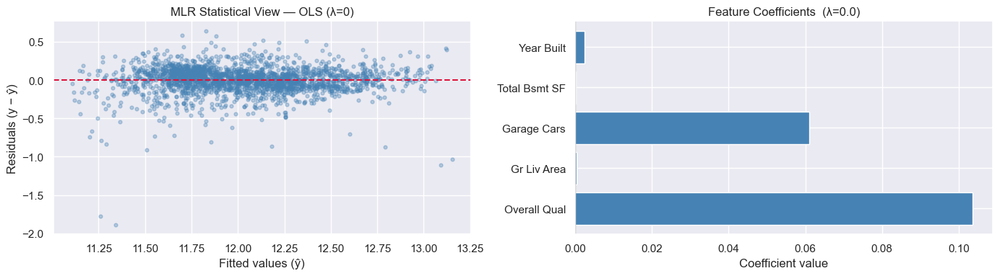

In [60]:
mlr_features = ['Overall Qual', 'Gr Liv Area', 'Garage Cars', 'Total Bsmt SF', 'Year Built']

# Use the raw (unscaled) arrays saved in cell 70, BEFORE StandardScaler was applied.
# This keeps scatter-matrix quantities (variance, covariance) interpretable:
# S_jj represents the true variance of each feature on its original scale.
X_mlr_train = X_mlr_train_raw
X_mlr_test  = X_mlr_test_raw
y_mlr_train = y_train.values.astype(float)
y_mlr_test  = y_test.values.astype(float)

mlr_stat_ols = MultiLinearRegressionStatisticalView()
mlr_stat_ols.fit(X_mlr_train, y_mlr_train, lambda_=0.0,
                 feature_names=mlr_features, show_steps=True)
mlr_stat_ols.plot(X_mlr_train, y_mlr_train,
                  title='MLR Statistical View — OLS (λ=0)')


### 1b · Ridge (λ=1) — step-by-step Statistical View

Adding $n\lambda\mathbf{I}$ to the scatter matrix inflates every diagonal entry,  
directly mirroring what $S_{XX} + n\lambda$ does in SLR.


  MLR Statistical View  (Ridge, λ=1.0)

Step 1 · Means
  n=2337,  p=5,  λ=1.0,  n·λ=2337.00
  ȳ = 12.019757
  x̄(Overall Qual) = 6.1037
  x̄(Gr Liv Area) = 1492.6245
  x̄(Garage Cars) = 1.7561
  x̄(Total Bsmt SF) = 1043.6554
  x̄(Year Built) = 1971.0539

Step 2 · Scatter Matrix  S_XX  (p×p)
  S_XX[j,k] = Σ(x_j · x_k) - n·x̄_j·x̄_k
[[4.46586000e+03 8.89384120e+05 1.48755000e+03 7.22184830e+05
  5.83154100e+04]
 [8.89384120e+05 5.31249242e+08 4.11575900e+05 1.79687048e+08
  8.29324024e+06]
 [1.48755000e+03 4.11575900e+05 1.26698000e+03 3.24476020e+05
  2.84047300e+04]
 [7.22184830e+05 1.79687048e+08 3.24476020e+05 3.94452446e+08
  1.23323993e+07]
 [5.83154100e+04 8.29324024e+06 2.84047300e+04 1.23323993e+07
  2.14926521e+06]]

Step 2 · Cross-Scatter Vector  S_Xy  (p,)
  S_Xy[j] = Σ(x_j · y) - n·x̄_j·ȳ
  S_Xy(Overall Qual) = 1079.9466
  S_Xy(Gr Liv Area) = 319955.3260
  S_Xy(Garage Cars) = 476.7619
  S_Xy(Total Bsmt SF) = 248168.5985
  S_Xy(Year Built) = 17660.8234

Step 3 · Ridge: inflat

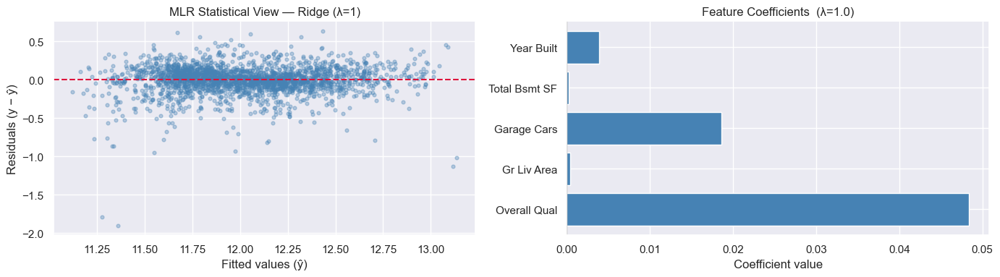

In [61]:
mlr_stat_ridge = MultiLinearRegressionStatisticalView()
mlr_stat_ridge.fit(X_mlr_train, y_mlr_train, lambda_=1.0,
                   feature_names=mlr_features, show_steps=True)
mlr_stat_ridge.plot(X_mlr_train, y_mlr_train,
                    title='MLR Statistical View — Ridge (λ=1)')


### 1c · Effect of λ — all coefficients shrink smoothly

Ridge **never** zeroes any coefficient — all slopes shrink continuously toward zero.


  lambda        R²    Overall Qual     Gr Liv Area     Garage Cars   Total Bsmt SF      Year Built
--------------------------------------------------------------------------------------------------
       0    0.8251        0.103703        0.000281        0.061125        0.000184        0.002455
     0.1    0.8242        0.093608        0.000299        0.048399        0.000195        0.002763
       1    0.8043        0.048378        0.000366        0.018568        0.000237        0.003881
      10    0.7684        0.008257        0.000420        0.002799        0.000273        0.004718
     100    0.7586        0.000959        0.000433        0.000333        0.000293        0.004358


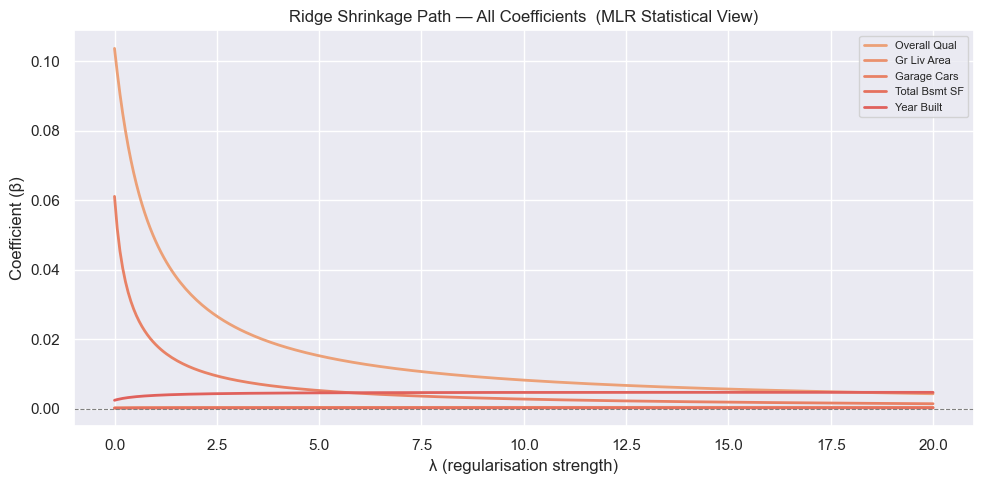

In [62]:
lambdas_r = [0, 0.1, 1, 10, 100]
colors_r  = ['black', 'steelblue', 'orange', 'green', 'purple']

print(f"{'lambda':>8}  {'R²':>8}  " + "  ".join(f"{f[:14]:>14}" for f in mlr_features))
print("-" * (8 + 10 + 16 * len(mlr_features)))
for lam in lambdas_r:
    m = MultiLinearRegressionStatisticalView()
    m.fit(X_mlr_train, y_mlr_train, lambda_=lam,
          feature_names=mlr_features, show_steps=False)
    vals = "  ".join(f"{b:>14.6f}" for b in m.beta)
    print(f"{lam:>8}  {m.R2:>8.4f}  {vals}")

# ── Shrinkage path ──────────────────────────────────────────────
lambdas_path = np.linspace(0, 20, 300)
betas_path   = np.zeros((len(lambdas_path), len(mlr_features)))
for k, lam in enumerate(lambdas_path):
    m = MultiLinearRegressionStatisticalView()
    m.fit(X_mlr_train, y_mlr_train, lambda_=lam,
          feature_names=mlr_features, show_steps=False)
    betas_path[k] = m.beta

plt.figure(figsize=(10, 5))
for j, fname in enumerate(mlr_features):
    plt.plot(lambdas_path, betas_path[:, j], lw=2, label=fname)
plt.axhline(0, color='grey', lw=0.8, linestyle='--')
plt.xlabel('λ (regularisation strength)')
plt.ylabel('Coefficient (β)')
plt.title('Ridge Shrinkage Path — All Coefficients  (MLR Statistical View)')
plt.legend(fontsize=8)
plt.tight_layout()
plt.show()


### 1d · Test Set Evaluation — Class 1 (Ridge Statistical View)

> A small Train R² – Test R² gap confirms the model generalises.


In [63]:
print("=" * 60)
print("  Class 1 — MLR Ridge Statistical View  |  Test Set")
print("=" * 60)

p_mlr = len(mlr_features)
models_stat_c1 = [
    ('OLS   (λ=0)',  mlr_stat_ols),
    ('Ridge (λ=1)', mlr_stat_ridge),
]

print(f"\n{'Model':<18}  {'Train R²':>9}  {'Test R²':>9}  {'Test MSE':>10}  {'Generalises?':>13}")
print("-" * 66)
for name, m in models_stat_c1:
    yp   = m.predict(X_mlr_test)
    nt   = len(y_mlr_test)
    sse  = float(np.sum((y_mlr_test - yp)**2))
    sst  = float(np.sum((y_mlr_test - y_mlr_test.mean())**2))
    mse  = sse / (nt - p_mlr - 1)
    r2   = 1 - sse / sst
    gap  = abs(m.R2 - r2)
    verdict = "Yes" if gap < 0.05 else "Check gap"
    print(f"{name:<18}  {m.R2:>9.4f}  {r2:>9.4f}  {mse:>10.4f}  {verdict:>13}")


  Class 1 — MLR Ridge Statistical View  |  Test Set

Model                Train R²    Test R²    Test MSE   Generalises?
------------------------------------------------------------------
OLS   (λ=0)            0.8251     0.8723      0.0214            Yes
Ridge (λ=1)            0.8043     0.8541      0.0245            Yes


---
## 2 · Multiple Linear Regression — Lasso Statistical View
*(Coordinate Descent with Soft-Thresholding in Scatter-Matrix form)*

---

### Why Can't Lasso Use a Closed-Form Scatter-Matrix Solution?

Ridge adds $\lambda\|\boldsymbol{\beta}\|_2^2$ — smooth everywhere → differentiate → linear system → closed form.

Lasso adds $\lambda\|\boldsymbol{\beta}\|_1$ — **not differentiable at $\beta_j = 0$** → no closed-form matrix inverse exists.

We use **Coordinate Descent**: minimise over one $\beta_j$ at a time, cycling until convergence — exactly as in the SLR Lasso Numerical View, but now extended to $p$ features using scatter-matrix quantities.

---

### Derivation of the Coordinate Update — Statistical Form

**Loss:**

$$\text{Loss} = \frac{1}{n}\sum_i\Bigl(y_i - B_0 - \sum_j \beta_j x_{ij}\Bigr)^2 + \lambda\sum_j|\beta_j|$$

**Step 1 — Compute scatter quantities once (before the loop):**

$$S_{XX,jk} = \sum_i x_{ij} x_{ik} - n\bar{x}_j\bar{x}_k, \qquad S_{Xy,j} = \sum_i x_{ij} y_i - n\bar{x}_j\bar{y}$$

$$S_{jj} = \frac{S_{XX,jj}}{n} \;\text{(variance of feature }j\text{)}, \qquad s_{Xy,j} = \frac{S_{Xy,j}}{n}$$

**Step 2 — Partial residual $\rho_j$ for feature $j$:**

$$\rho_j = s_{Xy,j} - \sum_{k \neq j} \beta_k \cdot \frac{S_{XX,jk}}{n}$$

This is "the covariance between feature $j$ and what's left of $y$ after accounting for all other features."

**Step 3 — Soft-Threshold update:**

$$\beta_j \leftarrow \frac{\mathcal{S}\bigl(\rho_j,\;\lambda/2\bigr)}{S_{jj}}, \qquad \mathcal{S}(z,t) = \text{sign}(z)\cdot\max(|z|-t,\;0)$$

> If $|\rho_j| \leq \lambda/2$, the slope $\beta_j$ is set to **exactly zero** — Lasso's sparsity property.

**Step 4 — Recover intercept after convergence:**

$$B_0 = \bar{y} - \boldsymbol{\beta}^\top\bar{\mathbf{x}}$$

---


In [64]:
class LassoMLRStatisticalView:
    """
    MLR solved via Lasso-penalised Coordinate Descent. NumPy only.
    Expressed using Scatter-Matrix quantities — the statistical representation.

    Loss = (1/n)*sum(yi - B0 - beta @ xi)^2 + lambda*sum|beta_j|

    Coordinate update for beta_j:
        rho_j  = s_Xy[j] - sum_{k!=j} beta_k * S_XX[j,k]/n
        beta_j <- S(rho_j, lambda/2) / S_jj
        where S(z,t) = sign(z)*max(|z|-t, 0)   (soft-threshold)

    lambda=0  ->  OLS (recovered via coordinate descent)
    lambda>0  ->  Lasso (some beta_j become exactly zero)
    """

    def __init__(self):
        self.beta    = None
        self.B0      = None
        self.SSE     = None
        self.MSE     = None
        self.R2      = None
        self.lambda_ = None
        self.feature_names_ = None
        self.loss_history   = []

    @staticmethod
    def _soft_threshold(z, t):
        return np.sign(z) * np.maximum(np.abs(z) - t, 0.0)

    def fit(self, X, y, lambda_=0.0, max_iter=10_000, tol=1e-10,
            feature_names=None, show_steps=True):
        X  = np.asarray(X, dtype=float)
        y  = np.asarray(y, dtype=float).reshape(-1)
        n, p = X.shape
        self.lambda_      = lambda_
        self.loss_history = []

        if feature_names is None:
            feature_names = [f"x{j+1}" for j in range(p)]
        self.feature_names_ = list(feature_names)

        # ── Step 1: Means ──────────────────────────────────────────────
        x_bar = X.mean(axis=0)
        y_bar = float(y.mean())

        # ── Step 2: Scatter quantities (computed once, reused each iter)
        #   S_XX[j,k] = sum(x_j * x_k) - n*x_bar_j*x_bar_k
        #   s_Xy[j]   = (sum(x_j * y) - n*x_bar_j*y_bar) / n
        #   S_jj      = S_XX[j,j] / n
        S_XX  = X.T @ X - n * np.outer(x_bar, x_bar)   # (p, p)
        s_Xy  = (X.T @ y - n * x_bar * y_bar) / n       # (p,)  normalised
        S_jj  = np.diag(S_XX) / n                        # (p,)  variances

        if show_steps:
            tag = f"Lasso, λ={lambda_}" if lambda_ else "OLS, λ=0"
            print("=" * 60)
            print(f"  MLR Lasso Statistical View  ({tag})")
            print("=" * 60)
            print(f"\nStep 1 · Means")
            print(f"  n={n},  p={p},  λ={lambda_},  λ/2={lambda_/2}")
            print(f"  ȳ = {y_bar:.6f}")
            print(f"\nStep 2 · Scatter quantities (computed once)")
            print(f"  S_XX[j,k] = Σ(x_j·x_k) - n·x̄_j·x̄_k")
            print(f"  s_Xy[j]   = (Σ(x_j·y) - n·x̄_j·ȳ) / n")
            print(f"  S_jj[j]   = S_XX[j,j] / n  (variance of feature j)")
            for name, s, v in zip(self.feature_names_, s_Xy, S_jj):
                print(f"    {name:>20s}:  s_Xy={s:.6f}  S_jj={v:.4f}")
            print(f"\nStep 3 · Soft-threshold update for each β_j")
            print(f"  ρ_j    = s_Xy[j] - Σ_{{k≠j}} β_k · S_XX[j,k]/n")
            print(f"  β_j   ← S(ρ_j, λ/2) / S_jj")
            print(f"  S(z,t) = sign(z)·max(|z|-t, 0),  t = {lambda_/2}")
            print(f"\nStep 4 · Cycle until max|Δβ| < {tol}")

        # ── Step 3 & 4: Coordinate Descent ────────────────────────────
        beta = np.zeros(p)
        t    = lambda_ / 2.0

        for it in range(1, max_iter + 1):
            beta_old = beta.copy()
            for j in range(p):
                # partial residual — statistical form
                off = np.delete(beta, j) @ (np.delete(S_XX[j], j) / n)
                rho_j  = s_Xy[j] - off
                beta[j] = self._soft_threshold(rho_j, t) / S_jj[j]

            # track loss  (B0 = y_bar - beta @ x_bar)
            B0_current = y_bar - float(beta @ x_bar)
            y_hat_c    = B0_current + X @ beta
            loss       = float(np.mean((y - y_hat_c) ** 2)) + lambda_ * np.sum(np.abs(beta))
            self.loss_history.append(loss)

            if np.max(np.abs(beta - beta_old)) < tol:
                if show_steps:
                    print(f"\nStep 5 · Converged at iteration {it}  (max|Δβ|={np.max(np.abs(beta - beta_old)):.2e})")
                break

        self.beta = beta
        self.B0   = y_bar - float(self.beta @ x_bar)

        # ── Metrics ────────────────────────────────────────────────────
        y_hat    = self.predict(X)
        e        = y - y_hat
        SST      = float(np.sum((y - y_bar)**2))
        self.SSE = float(np.sum(e**2))
        self.MSE = self.SSE / (n - p - 1)
        self.R2  = 1 - self.SSE / SST

        if show_steps:
            zeros = sum(1 for b in self.beta if b == 0.0)
            print(f"\nStep 5 · Coefficients after convergence")
            print(f"  B0 (intercept) = {self.B0:.6f}")
            for j, (name, b) in enumerate(zip(self.feature_names_, self.beta), start=1):
                flag = "  ← zeroed (Lasso sparsity)" if b == 0.0 else ""
                print(f"  B{j}({name}) = {b:.6f}{flag}")
            print(f"  Features zeroed out: {zeros}/{p}")
            eq = " + ".join(f"{b:.4f}·{nm}" for nm, b in zip(self.feature_names_, self.beta))
            print(f"\n  ŷ = {self.B0:.4f} + {eq}")
            print(f"\n  SSE={self.SSE:.4f}  |  MSE={self.MSE:.4f}  |  R²={self.R2:.4f}")
        return self

    def predict(self, X):
        if self.beta is None:
            raise ValueError("The model has not been fitted yet.")
        X = np.asarray(X, dtype=float)
        return self.B0 + X @ self.beta

    def plot(self, X, y, title=None):
        if self.beta is None:
            raise ValueError("The model has not been fitted yet.")
        y_hat = self.predict(X)
        e     = y - y_hat

        fig, axes = plt.subplots(1, 3, figsize=(18, 4))

        # Left — residuals vs fitted
        axes[0].scatter(y_hat, e, color='steelblue', alpha=0.35, s=12)
        axes[0].axhline(0, color='crimson', lw=1.5, linestyle='--')
        axes[0].set_xlabel('Fitted values (ŷ)')
        axes[0].set_ylabel('Residuals (y − ŷ)')
        axes[0].set_title(title or f'MLR Lasso Stat — Residuals  (λ={self.lambda_})')

        # Middle — coefficient bar chart
        colors_bar = ['steelblue' if b != 0 else 'lightgrey' for b in self.beta]
        axes[1].barh(self.feature_names_, self.beta, color=colors_bar)
        axes[1].axvline(0, color='black', lw=0.8)
        axes[1].set_xlabel('Coefficient value')
        axes[1].set_title(f'Feature Coefficients  (λ={self.lambda_})')

        # Right — loss curve
        axes[2].plot(self.loss_history, color='darkorchid', lw=1.5)
        axes[2].set_xlabel('Iteration')
        axes[2].set_ylabel('Loss')
        axes[2].set_title('Coordinate Descent Loss Curve')
        axes[2].set_yscale('log')

        plt.tight_layout()
        plt.show()


### 2a · OLS (λ=0) — Lasso Statistical View

When `lambda_=0`, $t=0$ so $\mathcal{S}(\rho_j,0)=\rho_j$ — the soft-threshold is a no-op and Coordinate Descent recovers the OLS solution.


  MLR Lasso Statistical View  (OLS, λ=0)

Step 1 · Means
  n=2337,  p=5,  λ=0.0,  λ/2=0.0
  ȳ = 12.019757

Step 2 · Scatter quantities (computed once)
  S_XX[j,k] = Σ(x_j·x_k) - n·x̄_j·x̄_k
  s_Xy[j]   = (Σ(x_j·y) - n·x̄_j·ȳ) / n
  S_jj[j]   = S_XX[j,j] / n  (variance of feature j)
            Overall Qual:  s_Xy=0.462108  S_jj=1.9109
             Gr Liv Area:  s_Xy=136.908569  S_jj=227321.0277
             Garage Cars:  s_Xy=0.204006  S_jj=0.5421
           Total Bsmt SF:  s_Xy=106.191099  S_jj=168785.8134
              Year Built:  s_Xy=7.557049  S_jj=919.6685

Step 3 · Soft-threshold update for each β_j
  ρ_j    = s_Xy[j] - Σ_{k≠j} β_k · S_XX[j,k]/n
  β_j   ← S(ρ_j, λ/2) / S_jj
  S(z,t) = sign(z)·max(|z|-t, 0),  t = 0.0

Step 4 · Cycle until max|Δβ| < 1e-10

Step 5 · Converged at iteration 32  (max|Δβ|=7.09e-11)

Step 5 · Coefficients after convergence
  B0 (intercept) = 5.830090
  B1(Overall Qual) = 0.103703
  B2(Gr Liv Area) = 0.000281
  B3(Garage Cars) = 0.061125
  B4(Total Bsmt 

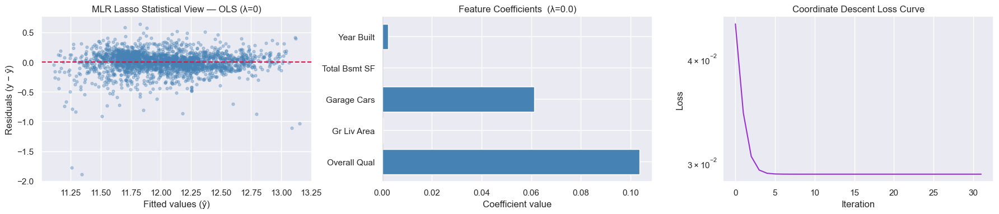

In [65]:
mlr_lasso_stat_ols = LassoMLRStatisticalView()
mlr_lasso_stat_ols.fit(X_mlr_train, y_mlr_train, lambda_=0.0,
                       feature_names=mlr_features, show_steps=True)
mlr_lasso_stat_ols.plot(X_mlr_train, y_mlr_train,
                        title='MLR Lasso Statistical View — OLS (λ=0)')


### 2b · Lasso (λ=0.001) — Soft-Thresholding in action

With even a small penalty, Lasso's soft-threshold sets the weakest predictors to **exactly zero**.


  MLR Lasso Statistical View  (Lasso, λ=0.001)

Step 1 · Means
  n=2337,  p=5,  λ=0.001,  λ/2=0.0005
  ȳ = 12.019757

Step 2 · Scatter quantities (computed once)
  S_XX[j,k] = Σ(x_j·x_k) - n·x̄_j·x̄_k
  s_Xy[j]   = (Σ(x_j·y) - n·x̄_j·ȳ) / n
  S_jj[j]   = S_XX[j,j] / n  (variance of feature j)
            Overall Qual:  s_Xy=0.462108  S_jj=1.9109
             Gr Liv Area:  s_Xy=136.908569  S_jj=227321.0277
             Garage Cars:  s_Xy=0.204006  S_jj=0.5421
           Total Bsmt SF:  s_Xy=106.191099  S_jj=168785.8134
              Year Built:  s_Xy=7.557049  S_jj=919.6685

Step 3 · Soft-threshold update for each β_j
  ρ_j    = s_Xy[j] - Σ_{k≠j} β_k · S_XX[j,k]/n
  β_j   ← S(ρ_j, λ/2) / S_jj
  S(z,t) = sign(z)·max(|z|-t, 0),  t = 0.0005

Step 4 · Cycle until max|Δβ| < 1e-10

Step 5 · Converged at iteration 32  (max|Δβ|=7.06e-11)

Step 5 · Coefficients after convergence
  B0 (intercept) = 5.790058
  B1(Overall Qual) = 0.103295
  B2(Gr Liv Area) = 0.000282
  B3(Garage Cars) = 0.059591
  

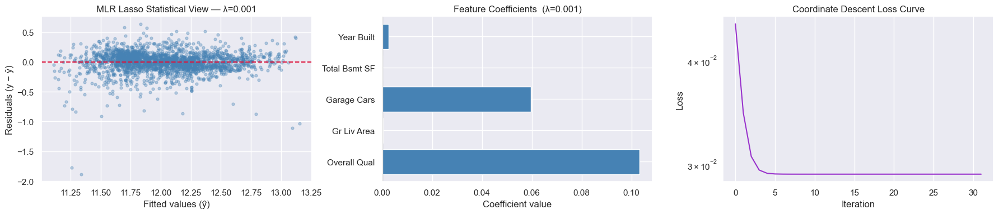

In [66]:
mlr_lasso_stat_l1 = LassoMLRStatisticalView()
mlr_lasso_stat_l1.fit(X_mlr_train, y_mlr_train, lambda_=0.001,
                      feature_names=mlr_features, show_steps=True)
mlr_lasso_stat_l1.plot(X_mlr_train, y_mlr_train,
                       title='MLR Lasso Statistical View — λ=0.001')


### 2c · Effect of λ — Lasso zeros features one by one

The order of dropout reveals feature importance: the last feature to survive is the strongest predictor.


  lambda        R²    Overall Qual     Gr Liv Area     Garage Cars   Total Bsmt SF      Year Built
--------------------------------------------------------------------------------------------------
       0    0.8251        0.103703        0.000281        0.061125        0.000184        0.002455
  0.0005    0.8251        0.103499        0.000281        0.060358        0.000185        0.002465
   0.001    0.8251        0.103295        0.000282        0.059591        0.000185        0.002476
   0.005    0.8250        0.101661        0.000287        0.053454        0.000188        0.002562
    0.01    0.8245        0.099619        0.000293        0.045784        0.000192        0.002670


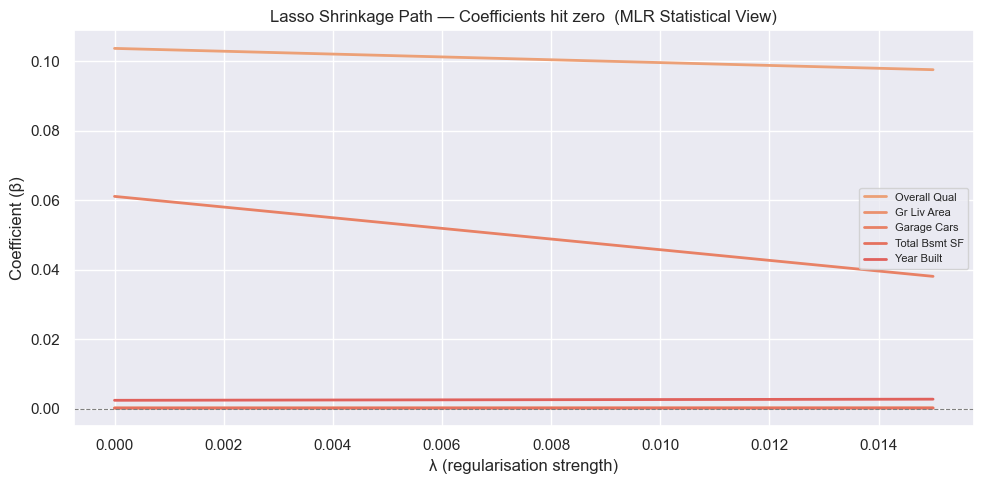

In [67]:
lambdas_l_mlr = [0, 0.0005, 0.001, 0.005, 0.01]

print(f"{'lambda':>8}  {'R²':>8}  " + "  ".join(f"{f[:14]:>14}" for f in mlr_features))
print("-" * (8 + 10 + 16 * len(mlr_features)))
for lam in lambdas_l_mlr:
    m = LassoMLRStatisticalView()
    m.fit(X_mlr_train, y_mlr_train, lambda_=lam,
          feature_names=mlr_features, show_steps=False)
    vals = "  ".join(f"{b:>14.6f}" for b in m.beta)
    print(f"{lam:>8}  {m.R2:>8.4f}  {vals}")

# ── Shrinkage path ──────────────────────────────────────────────
lambdas_path_l = np.linspace(0, 0.015, 300)
betas_path_l   = np.zeros((len(lambdas_path_l), len(mlr_features)))
for k, lam in enumerate(lambdas_path_l):
    m = LassoMLRStatisticalView()
    m.fit(X_mlr_train, y_mlr_train, lambda_=lam,
          feature_names=mlr_features, show_steps=False)
    betas_path_l[k] = m.beta

plt.figure(figsize=(10, 5))
for j, fname in enumerate(mlr_features):
    plt.plot(lambdas_path_l, betas_path_l[:, j], lw=2, label=fname)
plt.axhline(0, color='grey', lw=0.8, linestyle='--')
plt.xlabel('λ (regularisation strength)')
plt.ylabel('Coefficient (β)')
plt.title('Lasso Shrinkage Path — Coefficients hit zero  (MLR Statistical View)')
plt.legend(fontsize=8)
plt.tight_layout()
plt.show()


### 2d · Ridge vs Lasso Shrinkage Path — Side-by-Side

| | Ridge | Lasso |
|---|---|---|
| Penalty | $\lambda\|\boldsymbol{\beta}\|_2^2$ — L2 | $\lambda\|\boldsymbol{\beta}\|_1$ — L1 |
| Effect | Shrinks all β **smoothly** toward zero | Sets some β to **exactly zero** |
| Useful when | All features matter a little | Some features are irrelevant |


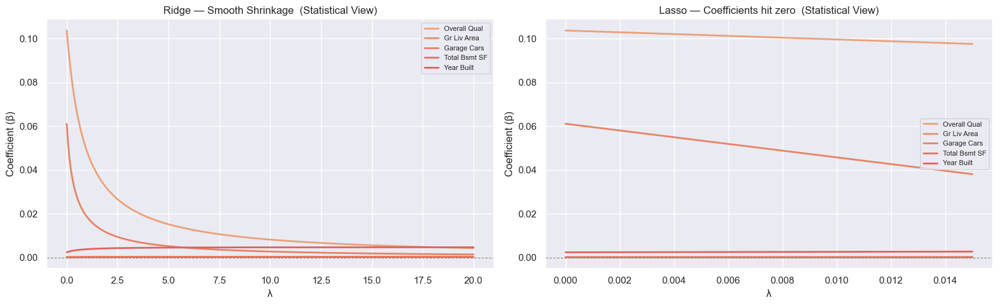

In [68]:
# Ridge and Lasso shrinkage paths were already computed in cells 104 and 114.
# We reuse betas_path (Ridge) and betas_path_l (Lasso) directly —
# no need to refit hundreds of models again.

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

for j, fname in enumerate(mlr_features):
    axes[0].plot(lambdas_path, betas_path[:, j], lw=2, label=fname)
axes[0].axhline(0, color='grey', lw=0.8, linestyle='--')
axes[0].set_xlabel('λ')
axes[0].set_ylabel('Coefficient (β)')
axes[0].set_title('Ridge — Smooth Shrinkage  (Statistical View)')
axes[0].legend(fontsize=8)

for j, fname in enumerate(mlr_features):
    axes[1].plot(lambdas_path_l, betas_path_l[:, j], lw=2, label=fname)
axes[1].axhline(0, color='grey', lw=0.8, linestyle='--')
axes[1].set_xlabel('λ')
axes[1].set_ylabel('Coefficient (β)')
axes[1].set_title('Lasso — Coefficients hit zero  (Statistical View)')
axes[1].legend(fontsize=8)

plt.tight_layout()
plt.show()


### 2e · Test Set Evaluation — Class 2 (Lasso Statistical View)

> If Lasso Test R² ≥ OLS Test R², the penalty helped generalisation.


In [69]:
print("=" * 60)
print("  Class 2 — MLR Lasso Statistical View  |  Test Set")
print("=" * 60)

models_stat_c2 = [
    ('OLS    (λ=0)',    mlr_lasso_stat_ols),
    ('Lasso  (λ=0.001)', mlr_lasso_stat_l1),
]

print(f"\n{'Model':<22}  {'Train R²':>9}  {'Test R²':>9}  {'Test MSE':>10}  {'Generalises?':>13}")
print("-" * 72)
for name, m in models_stat_c2:
    yp  = m.predict(X_mlr_test)
    nt  = len(y_mlr_test)
    sse = float(np.sum((y_mlr_test - yp)**2))
    sst = float(np.sum((y_mlr_test - y_mlr_test.mean())**2))
    mse = sse / (nt - p_mlr - 1)
    r2  = 1 - sse / sst
    gap = abs(m.R2 - r2)
    verdict = "Yes" if gap < 0.05 else "Check gap"
    print(f"{name:<22}  {m.R2:>9.4f}  {r2:>9.4f}  {mse:>10.4f}  {verdict:>13}")


  Class 2 — MLR Lasso Statistical View  |  Test Set

Model                    Train R²    Test R²    Test MSE   Generalises?
------------------------------------------------------------------------
OLS    (λ=0)               0.8251     0.8723      0.0214            Yes
Lasso  (λ=0.001)           0.8251     0.8722      0.0214            Yes


### Combined Summary — All MLR Statistical View Models on Test Set

In [70]:
print("=" * 72)
print("  All MLR Statistical View Models — Test Set Comparison")
print("=" * 72)

all_stat_models = [
    ('Class 1 | Ridge OLS     (λ=0)',   mlr_stat_ols),
    ('Class 1 | Ridge         (λ=1)',   mlr_stat_ridge),
    ('Class 2 | Lasso OLS     (λ=0)',   mlr_lasso_stat_ols),
    ('Class 2 | Lasso         (λ=0.001)', mlr_lasso_stat_l1),
]

print(f"\n{'Model':<36}  {'Train R²':>9}  {'Test R²':>9}  {'Test MSE':>10}")
print("-" * 72)
for name, m in all_stat_models:
    yp  = m.predict(X_mlr_test)
    nt  = len(y_mlr_test)
    sse = float(np.sum((y_mlr_test - yp)**2))
    sst = float(np.sum((y_mlr_test - y_mlr_test.mean())**2))
    mse = sse / (nt - p_mlr - 1)
    r2  = 1 - sse / sst
    print(f"{name:<36}  {m.R2:>9.4f}  {r2:>9.4f}  {mse:>10.4f}")


  All MLR Statistical View Models — Test Set Comparison

Model                                  Train R²    Test R²    Test MSE
------------------------------------------------------------------------
Class 1 | Ridge OLS     (λ=0)            0.8251     0.8723      0.0214
Class 1 | Ridge         (λ=1)            0.8043     0.8541      0.0245
Class 2 | Lasso OLS     (λ=0)            0.8251     0.8723      0.0214
Class 2 | Lasso         (λ=0.001)        0.8251     0.8722      0.0214


# Model Fitting  Machine Learning View (Gradient Descent) : 

###  One Unified Class Design

The ML View uses **a single class** — `LinearRegressionML` — that acts as the unified regression engine for *any* number of features and *any* regularisation setting:

| Parameter | Value | Behaviour |
|---|---|---|
| `X` (features) | 1 column | Simple Linear Regression |
| `X` (features) | p columns | Multiple Linear Regression |
| `l1=0, l2=0` | both zero | Pure OLS (no regularisation) |
| `l1>0, l2=0` | L1 only | **Lasso** — sparsity, exact zeros |
| `l1=0, l2>0` | L2 only | **Ridge** — smooth shrinkage |

---

### 2d · Ridge vs Lasso Shrinkage Path — Side-by-Side

| | Ridge | Lasso |
|---|---|---|
| Penalty | $\lambda\|\boldsymbol{\beta}\|_2^2$ — L2 | $\lambda\|\boldsymbol{\beta}\|_1$ — L1 |
| Effect | Shrinks all β **smoothly** toward zero | Sets some β to **exactly zero** |
| Useful when | All features matter a little | Some features are irrelevant |



## Mathematical Derivation

### Loss Function (General Form)

$$\text{Loss}(\boldsymbol{\beta}) = \underbrace{\frac{1}{n}\sum_{i=1}^{n}(y_i - \hat{y}_i)^2}_{\text{MSE}} + \underbrace{\lambda_2 \sum_{j=1}^{p}\beta_j^2}_{\text{Ridge / L2}} + \underbrace{\lambda_1 \sum_{j=1}^{p}|\beta_j|}_{\text{Lasso / L1}}$$

where $\hat{y}_i = \beta_0 + \beta_1 x_{i1} + \cdots + \beta_p x_{ip}$.

> The intercept $\beta_0$ is **never penalised** .

---

## Gradient Derivations — Three Cases



### Case 1 · OLS (No Regularisation) — $\lambda_1 = 0,\ \lambda_2 = 0$

**Loss:**

$$\text{Loss} = \frac{1}{n}\sum_{i=1}^{n}(y_i - \hat{y}_i)^2$$

**Gradient w.r.t. $\beta_0$ (intercept):**

$$\frac{\partial L}{\partial \beta_0} = -\frac{2}{n}\sum_{i=1}^{n}(y_i - \hat{y}_i)$$

**Gradient w.r.t. $\beta_j$ (slope):**

$$\frac{\partial L}{\partial \beta_j} = -\frac{2}{n}\sum_{i=1}^{n}(y_i - \hat{y}_i)\,x_{ij}$$

**Update Rule:**

$$\beta_0 = \beta_0 - \alpha\left(-\frac{2}{n}\sum(y_i - \hat{y}_i)\right)$$

$$\beta_j = \beta_j - \alpha\left(-\frac{2}{n}\sum(y_i - \hat{y}_i)\,x_{ij}\right)$$

> No penalty term 

---


### Case 2 · Ridge Regression : $\lambda_2 > 0,\ \lambda_1 = 0$

**Loss:**

$$\text{Loss} = \frac{1}{n}\sum_{i=1}^{n}(y_i - \hat{y}_i)^2 + \lambda_2\sum_{j=1}^{p}\beta_j^2$$

**Gradient w.r.t. $\beta_0$ (intercept — unpenalised):**

$$\frac{\partial L}{\partial \beta_0} = -\frac{2}{n}\sum_{i=1}^{n}(y_i - \hat{y}_i)$$

**Gradient w.r.t. $\beta_j$ (slope — penalised):**

$$\frac{\partial L}{\partial \beta_j} = -\frac{2}{n}\sum_{i=1}^{n}(y_i - \hat{y}_i)\,x_{ij} +2\lambda_2\,\beta_j$$

**Update Rule:**

$$\beta_0 = \beta_0 - \alpha\left(-\frac{2}{n}\sum(y_i - \hat{y}_i)\right)$$

$$\beta_j = \beta_j - \alpha\left(-\frac{2}{n}\sum(y_i - \hat{y}_i)\,x_{ij} +2\lambda_2\,\beta_j\right)$$

> The $+2\lambda_2\beta_j$ term adds an extra push toward zero at every step — the larger $\beta_j$ is, the stronger the pull.  
  
> Slopes shrink **smoothly and continuously** toward zero but **never reach exactly zero**.

---

### Case 3 · Lasso Regression — $\lambda_1 > 0,\ \lambda_2 = 0$

**Loss:**

$$\text{Loss} = \frac{1}{n}\sum_{i=1}^{n}(y_i - \hat{y}_i)^2 + \lambda_1\sum_{j=1}^{p}|\beta_j|$$

**Gradient w.r.t. $\beta_0$ (intercept — unpenalised):**

$$\frac{\partial L}{\partial \beta_0} = -\frac{2}{n}\sum_{i=1}^{n}(y_i - \hat{y}_i)$$

**Gradient w.r.t. $\beta_j$ (slope — penalised):**

$$\frac{\partial L}{\partial \beta_j} = -\frac{2}{n}\sum_{i=1}^{n}(y_i - \hat{y}_i)\,x_{ij} + \lambda_1\,\text{sign}(\beta_j)$$

**Update Rule:**

$$\beta_0 = \beta_0 - \alpha\left(-\frac{2}{n}\sum(y_i - \hat{y}_i)\right)$$

$$\beta_j = \beta_j - \alpha\left(-\frac{2}{n}\sum(y_i - \hat{y}_i)\,x_{ij} + \lambda_1\,\text{sign}(\beta_j)\right)$$

> This is what makes Lasso produce **exact zeros** — once a slope is close enough to zero, the penalty pushes it all the way through.  
> Slopes are **hard-zeroed** for weak predictors, producing sparse models (automatic feature selection).

---

### Summary — What Changes Between Cases

| | OLS | Ridge | Lasso |
|---|---|---|---|
| Extra gradient term | — | $+2\lambda_2\beta_j$ | $+\lambda_1\,\text{sign}(\beta_j)$ |
| Penalty shape | None | Quadratic (L2) | Absolute value (L1) |
| Slope behaviour | Unregularised | Shrinks smoothly → 0 | Can reach **exactly 0** |
| Feature selection | No | No | **Yes** |


In [71]:
class LinearRegressionGD:
    def __init__(self):
        self.w = None 
        self.b = None 
        self.loss_history = [] 

    def fit(self, X, y, learning_rate=0.01, epochs=5000, tolerance=1e-6, l1_penalty=0, l2_penalty=0):
        
        self.X = np.array(X, dtype=float)
        if self.X.ndim == 1:          
            self.X = self.X.reshape(-1, 1)
        
        self.y = np.array(y)
        self.n = len(self.y)
    
        self.w = np.zeros(self.X.shape[1])
        self.b = 0.0
        self.loss_history = []
        last_loss = float('inf')

        for i in range(epochs):
            y_hat = self.b + np.dot(self.X, self.w)
            error = self.y - y_hat
            
            dB = (-2/self.n) * np.sum(error) 
            dW = (-2/self.n) * np.dot(self.X.T, error)
            
            if l2_penalty > 0:
                dW += (2 * l2_penalty * self.w)
            if l1_penalty > 0:
                dW += (l1_penalty * np.sign(self.w))
            
            self.b -= learning_rate * dB
            self.w -= learning_rate * dW
    
            mse = np.mean(error ** 2)

            l2_term = l2_penalty  * np.sum(self.w ** 2) 
            l1_term = l1_penalty  * np.sum(np.abs(self.w)) 

            current_loss = mse + l1_term + l2_term

            
            self.loss_history.append(current_loss)
        
            if abs(last_loss - current_loss) < tolerance:
                break
            last_loss = current_loss

    def predict(self, X):
        X = np.array(X, dtype=float)
        if X.ndim == 1:             
            X = X.reshape(-1, 1)
        return self.b + np.dot(X, self.w)

    def evaluate(self, X_test, y_test):
        X_test = np.array(X_test, dtype=float)
        if X_test.ndim == 1:          
            X_test = X_test.reshape(-1, 1)
        
        y_pred_log = self.predict(X_test)
        y_pred_real = np.expm1(y_pred_log)
        y_test_real = np.expm1(y_test)
        
        n = len(y_test_real)
        k = X_test.shape[1]
        
        mse = np.mean((y_test_real - y_pred_real)**2)
        rmse = np.sqrt(mse)
        
        ss_res = np.sum((y_test_real - y_pred_real)**2)
        ss_tot = np.sum((y_test_real - np.mean(y_test_real))**2)
        r2 = 1 - (ss_res / ss_tot)
        
        adj_r2 = 1 - ((1 - r2) * (n - 1) / (n - k - 1))
        
        return {
            "RMSE": round(rmse, 4),
            "R2": round(r2, 4),
            "Adjusted_R2": round(adj_r2, 4)
        }

### Linear Regression using Gradient Descent (with L1 & L2 Regularization) : 
#### this implementation builds a Linear Regression model optimized using Gradient Descent.
#### The model supports both:

#### L1 Regularization (Lasso) → encourages sparsity (feature selection)
#### L2 Regularization (Ridge) → discourages large weights (weight shrinkage)

### Hypothesis Function

#### The model predicts using a linear function:

####   y_hat​=Xw+b

#### Where:

#### X: input features
#### w: weights (coefficients)
#### b: bias (intercept)

### Loss Function : 

#### $$\text{Loss}(\boldsymbol{\beta}) = \underbrace{\frac{1}{n}\sum_{i=1}^{n}(y_i - \hat{y}_i)^2}_{\text{MSE}} + \underbrace{\lambda_2 \sum_{j=1}^{p}\beta_j^2}_{\text{Ridge / L2}} + \underbrace{\lambda_1 \sum_{j=1}^{p}|\beta_j|}_{\text{Lasso / L1}}$$

#### Where: 
#### First term → Mean Squared Error (data fitting)
#### Second term → L2 penalty (Ridge)
#### Third term → L1 penalty (Lasso)


### Optimization Method :

#### Computes gradients over the full dataset each iteration 
#### Updates weights and bias using learning rate

### Evaluation : 

#### Evaluation is performed in the original scale because the model is trained on log-transformed target:

#### 1- Predict in log space
#### 2- Convert back using: y=e^y−1

#### Compute metrics: 

#### RMSE
#### R² 
#### Adjusted R² 

#### Adjusted R² is used to evaluate model performance while penalizing unnecessary features, making it more reliable than R² when comparing models with different numbers of variables


In [72]:
# Hyperparameters
learning_rates = [0.001, 0.01, 0.05, 0.1]

l1_lambdas = [0, 0.001, 0.01, 0.1]   # for Lasso
l2_lambdas = [0, 0.001, 0.01, 0.1]   # for Ridge

epochs_list = [1000, 2000, 3000, 5000]

#### I declared some values to use it in manual grid search to get the best values of hyperparameters

In [73]:
ols_results = []

for lr in learning_rates:
    for ep in epochs_list:

        model = LinearRegressionGD()
        model.fit(
            X_train, y_train,
            learning_rate=lr,
            epochs=ep,
            l1_penalty=0,
            l2_penalty=0
        )

        y_pred = model.predict(X_test)
        mse = np.mean((np.expm1(y_test) - np.expm1(y_pred))**2)


        ols_results.append({
            "lr": lr,
            "epochs": ep,
            "mse": mse
        })

In [74]:
lasso_results = []

for lr in learning_rates:
    for l1 in l1_lambdas:
        for ep in epochs_list:

            model = LinearRegressionGD()
            model.fit(
                X_train, y_train,
                learning_rate=lr,
                epochs=ep,
                l1_penalty=l1,
                l2_penalty=0
            )

            y_pred = model.predict(X_test)
            mse = np.mean((np.expm1(y_test) - np.expm1(y_pred))**2)


            lasso_results.append({
                "lr": lr,
                "l1": l1,
                "epochs": ep,
                "mse": mse
            })

In [75]:
ridge_results = []

for lr in learning_rates:
    for l2 in l2_lambdas:
        for ep in epochs_list:

            model = LinearRegressionGD()
            model.fit(
                X_train, y_train,
                learning_rate=lr,
                epochs=ep,
                l1_penalty=0,
                l2_penalty=l2
            )

            y_pred = model.predict(X_test)
            mse = np.mean((np.expm1(y_test) - np.expm1(y_pred))**2)


            ridge_results.append({
                "lr": lr,
                "l2": l2,
                "epochs": ep,
                "mse": mse
            })

#### This is a manual grid search, where the model is trained multiple times using all possible combinations of predefined learning rates and epochs, and the best configuration is selected based on the lowest test MSE.

In [76]:
best_lasso = min(lasso_results, key=lambda x: x["mse"])
best_ridge = min(ridge_results, key=lambda x: x["mse"])
best_ols   = min(ols_results, key=lambda x: x["mse"])

print("Best Lasso:", best_lasso)
print("Best Ridge:", best_ridge)
print("Best OLS:", best_ols)

Best Lasso: {'lr': 0.1, 'l1': 0.001, 'epochs': 5000, 'mse': np.float64(842606188.8902782)}
Best Ridge: {'lr': 0.1, 'l2': 0.001, 'epochs': 3000, 'mse': np.float64(844186375.1431751)}
Best OLS: {'lr': 0.1, 'epochs': 3000, 'mse': np.float64(895577901.8833208)}


In [77]:
# Lasso
model_lasso = LinearRegressionGD()
model_lasso.fit(X_train, y_train, learning_rate=0.1, epochs=5000, l1_penalty=0.001)

# Ridge
model_ridge = LinearRegressionGD()
model_ridge.fit(X_train, y_train, learning_rate=0.1, epochs=2000, l2_penalty=0.001)

# Normal
model_normal = LinearRegressionGD()
model_normal.fit(X_train, y_train, learning_rate=0.1, epochs=3000)


In [78]:
summary = pd.DataFrame([
    {"Model": "Lasso", "Set": "Train", **model_lasso.evaluate(X_train, y_train)},
    {"Model": "Lasso", "Set": "Test",  **model_lasso.evaluate(X_test,  y_test)},
    {"Model": "Ridge", "Set": "Train", **model_ridge.evaluate(X_train, y_train)},
    {"Model": "Ridge", "Set": "Test",  **model_ridge.evaluate(X_test,  y_test)},
    {"Model": "OLS",   "Set": "Train", **model_normal.evaluate(X_train, y_train)},
    {"Model": "OLS",   "Set": "Test",  **model_normal.evaluate(X_test,  y_test)},
])
display(summary)

,Model,Set,RMSE,R2,Adjusted_R2
0,Lasso,Train,28100.6016,0.8734,0.8713
1,Lasso,Test,29027.6797,0.8791,0.8707
2,Ridge,Train,28573.5357,0.8691,0.8669
3,Ridge,Test,29620.2657,0.8741,0.8653
4,OLS,Train,28904.7143,0.8660,0.8638
5,OLS,Test,29926.2076,0.8715,0.8625


#### All three models show very close performance in terms of RMSE and R² 

#### Lasso regression performs best overall on the test set :
#### indicating that some features may be less relevant and benefit from feature selection.

#### OLS has higher training error and significantly worse test error 

#### test and train diff is small this indicates that no overfitting in the model 

### lasso and ridge better than OLS that clears the importance of regularisation 



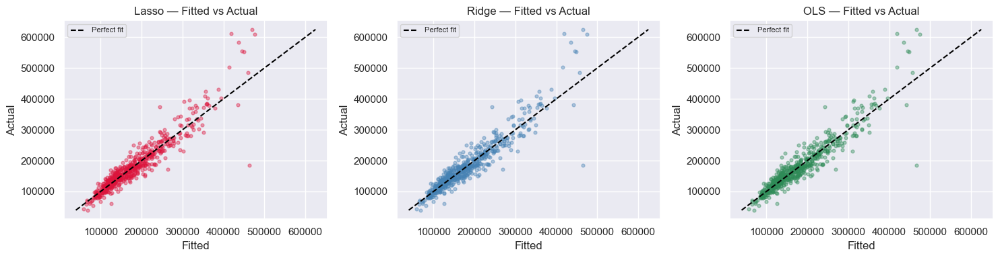

In [79]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
models = {"Lasso": (model_lasso, "crimson"), 
          "Ridge": (model_ridge, "steelblue"), 
          "OLS":   (model_normal, "seagreen")}

for ax, (name, (model, color)) in zip(axes, models.items()):
    y_hat = np.expm1(model.predict(X_test))
    y_t   = np.expm1(y_test)
    mn, mx = min(y_hat.min(), y_t.min()), max(y_hat.max(), y_t.max())
    ax.scatter(y_hat, y_t, color=color, alpha=0.4, s=12)
    ax.plot([mn, mx], [mn, mx], "k--", lw=1.5, label="Perfect fit")
    ax.set_title(f"{name} — Fitted vs Actual")
    ax.set_xlabel("Fitted")
    ax.set_ylabel("Actual")
    ax.legend(fontsize=8)

plt.tight_layout()
plt.show()

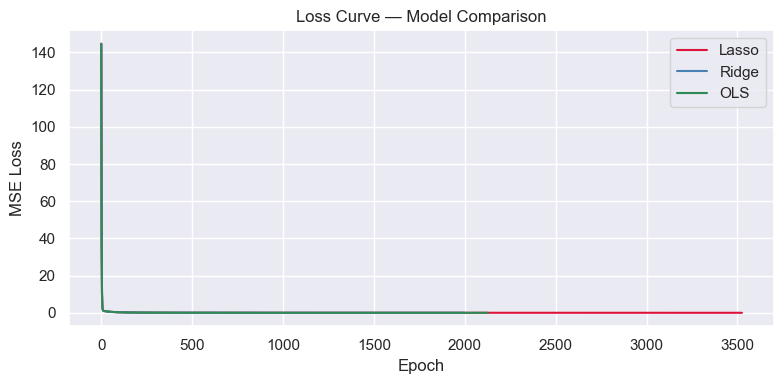

In [80]:
plt.figure(figsize=(8, 4))
plt.plot(model_lasso.loss_history,  color="crimson",   lw=1.5, label="Lasso")
plt.plot(model_ridge.loss_history,  color="steelblue", lw=1.5, label="Ridge")
plt.plot(model_normal.loss_history, color="seagreen",  lw=1.5, label="OLS")
plt.xlabel("Epoch")
plt.ylabel("MSE Loss")
plt.title("Loss Curve — Model Comparison")
plt.legend()
plt.tight_layout()
plt.show()

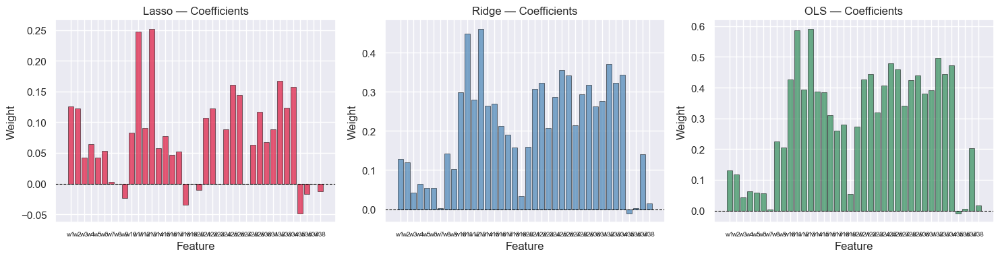

In [81]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

for ax, (name, (model, color)) in zip(axes, models.items()):
    x_pos = np.arange(len(model.w))
    ax.bar(x_pos, model.w, color=color, alpha=0.7, edgecolor="black", lw=0.5)
    ax.axhline(0, color="black", lw=0.8, linestyle="--")
    ax.set_title(f"{name} — Coefficients")
    ax.set_xlabel("Feature")
    ax.set_ylabel("Weight")
    ax.set_xticks(x_pos)
    ax.set_xticklabels([f"w{j+1}" for j in x_pos], fontsize=7)

plt.tight_layout()
plt.show()

#### This figure compares the feature coefficients of three linear models: Lasso, Ridge, and OLS. Each bar represents the weight assigned to a feature, indicating its importance.

#### Lasso applies L1 regularization, which forces some coefficients to become exactly zero, effectively performing feature selection. Ridge uses L2 regularization, shrinking coefficients toward zero but keeping all features in the model. OLS (Ordinary Least Squares) has no regularization, so it often produces larger and more variable coefficients.

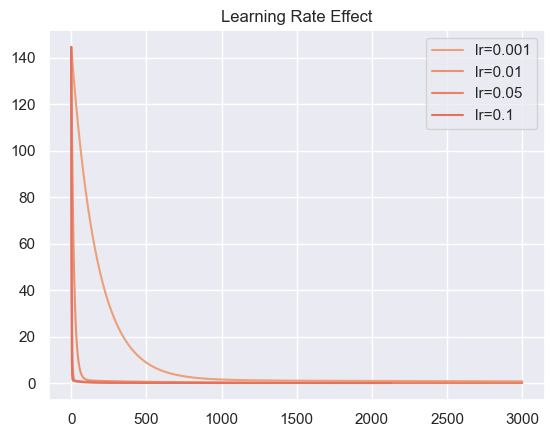

In [82]:
for lr in learning_rates:
    losses = []
    model = LinearRegressionGD()
    model.fit(X_train, y_train, learning_rate=lr, epochs=3000)
    plt.plot(model.loss_history, label=f"lr={lr}")

plt.legend()
plt.title("Learning Rate Effect")
plt.show()

 ### Based on the manual grid search results, Ridge regression achieved the best performance with the lowest MSE, followed closely by Lasso, while OLS performed slightly worse. Additionally, a learning rate of 0.1 provided the best results, likely due to the data being properly scaled, allowing faster and more effective convergence.

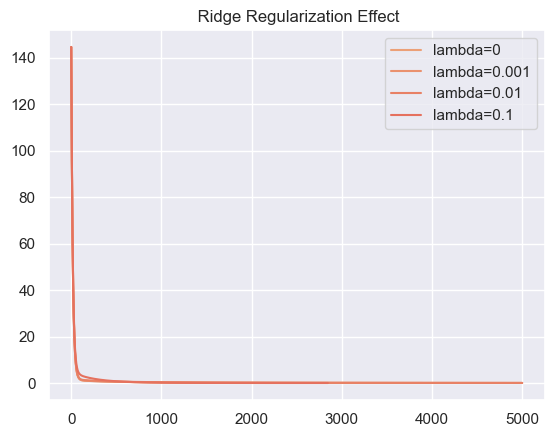

In [83]:
for lam in l2_lambdas:
    model = LinearRegressionGD()
    model.fit(X_train, y_train, l2_penalty=lam)
    plt.plot(model.loss_history, label=f"lambda={lam}")

plt.legend()
plt.title(" Ridge Regularization Effect")
plt.show()

 ### Although all curves converge to similar loss values, L2 regularization mainly affects the training stability rather than the final performance on this dataset.

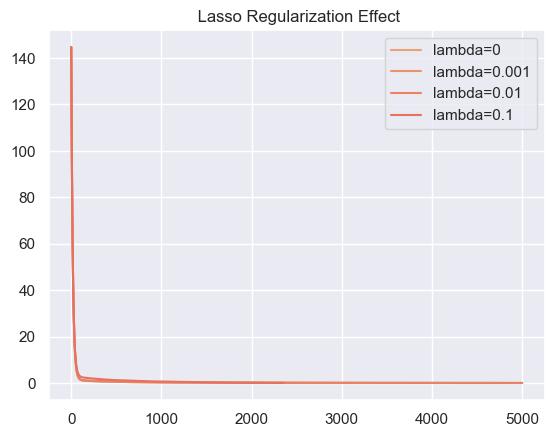

In [84]:
for lam in l1_lambdas:
    model = LinearRegressionGD()
    model.fit(X_train, y_train, l1_penalty=lam)
    plt.plot(model.loss_history, label=f"lambda={lam}")

plt.legend()
plt.title(" Lasso Regularization Effect")
plt.show()

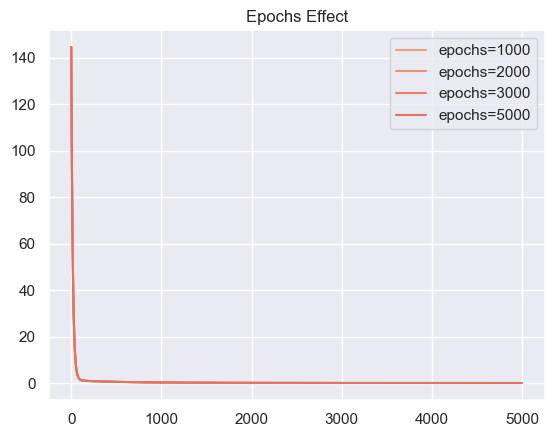

In [85]:
for ep in epochs_list:
    model = LinearRegressionGD()
    model.fit(X_train, y_train, epochs=ep)
    plt.plot(model.loss_history, label=f"epochs={ep}")

plt.legend()
plt.title("Epochs Effect")
plt.show()

### The loss drops very sharply in the early epochs, which means the model learns the main pattern quickly.
### After a relatively small number of epochs, the loss stabilizes near zero, indicating convergence.
### Increasing the number of epochs (1000 → 5000) does not significantly improve performance after convergence.

In [86]:
y_real = np.expm1(y_test)  
print(f"avg price : {y_real.mean():,.0f}")
print(f"min price    : {y_real.min():,.0f}")
print(f"max price  : {y_real.max():,.0f}")

avg price : 182,272
min price    : 39,300
max price  : 625,000


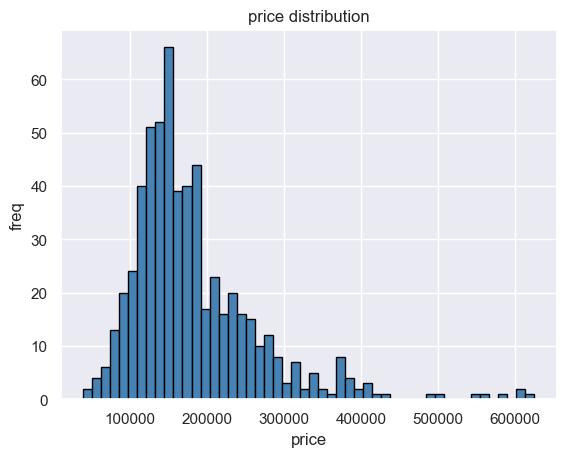

In [87]:
import matplotlib.pyplot as plt
y_real = np.expm1(y_test)
plt.hist(y_real, bins=50, color="steelblue", edgecolor="black")
plt.title("price distribution")
plt.xlabel("price")
plt.ylabel("freq")
plt.show()

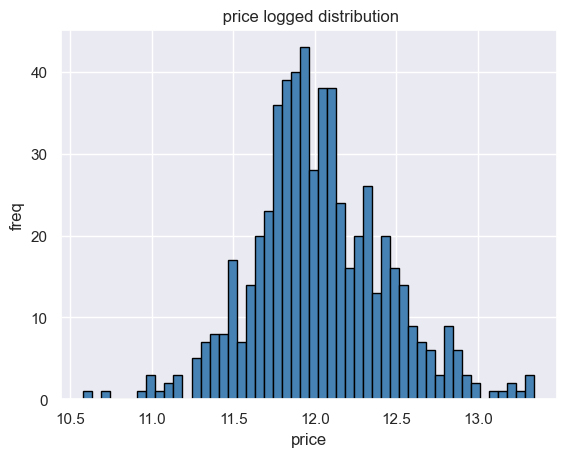

In [88]:
import matplotlib.pyplot as plt
y_Log = y_test
plt.hist(y_Log, bins=50, color="steelblue", edgecolor="black")
plt.title(" price logged distribution")
plt.xlabel("price")
plt.ylabel("freq")
plt.show()

### this is the reason of train the model on log due to the right skew in data so the log help in normalization 

In [89]:
X_simple_train = X_train[["Overall Qual"]].values
X_simple_test = X_test[["Overall Qual"]].values

In [90]:
model_simple = LinearRegressionGD()

model_simple.fit(
    X_simple_train,
    y_train,
    learning_rate=0.001,
    epochs=5000,
    l1_penalty=0,
    l2_penalty=0
)

In [91]:
results = model_simple.evaluate(X_simple_test, y_test)

results_df = pd.DataFrame([results])
print(results_df)

         RMSE     R2  Adjusted_R2
0  48819.5979  0.658       0.6574


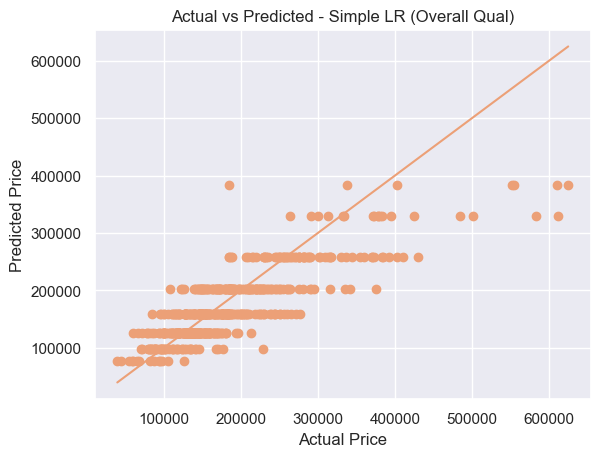

In [92]:


# predictions
y_pred = np.expm1(model_simple.predict(X_simple_test))

# actual values 
y_true = np.expm1(y_test)
plt.figure()

# scatter plot
plt.scatter(y_true, y_pred)

# perfect prediction line
min_v = min(y_true.min(), y_pred.min())
max_v = max(y_true.max(), y_pred.max())
plt.plot([min_v, max_v], [min_v, max_v])

plt.xlabel("Actual Price")
plt.ylabel("Predicted Price")
plt.title("Actual vs Predicted - Simple LR (Overall Qual)")

plt.show()

### simple linear regression with the most correlated feature to price " overall qal " that is explain 65% of the variance in the data 

## spec 2 for statical view

In [93]:
# Spec 2 — Full Model  for statical view 
spec2_ridge_model = MultiLinearRegressionStatisticalView()
spec2_ridge_model.fit(X_train.values.astype(float), y_train.values.astype(float),
                      lambda_=1.0, feature_names=list(X_train.columns), show_steps=False)

spec2_lasso_model = LassoMLRStatisticalView()
spec2_lasso_model.fit(X_train.values.astype(float), y_train.values.astype(float),
                      lambda_=0.001, feature_names=list(X_train.columns), show_steps=False)

print("spec 2 Done")
print(f"Number of features in full model: {X_train.shape[1]}")

spec 2 Done
Number of features in full model: 38


In [94]:
def get_test_r2(model, X_te, y_te):
    yp  = model.predict(X_te)
    sse = float(np.sum((y_te - yp) ** 2))
    sst = float(np.sum((y_te - y_te.mean()) ** 2))
    return 1 - sse / sst

def get_adj_r2(r2, n, p):
    if n - p - 1 <= 0:
        return float('nan')
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

# data
y_te   = y_test.values.astype(float)
n_te   = len(y_te)
n_full = X_test.shape[1]

x_sp1_te   = X_test['Overall Qual'].values.astype(float)   # Spec 1 
X_sp2_te   = X_test.values.astype(float)                   # Spec 2 (all features)
X_sp3_te   = X_mlr_test_raw                                 # Spec 3 


rows = [
    ("Spec 1 — Best Single Predictor", "Ridge (λ=1.0)",    1,      slr_stat_ridge,    x_sp1_te),
    ("Spec 1 — Best Single Predictor", "Lasso (λ=0.1)",    1,      slr_stat_lasso,    x_sp1_te),
    ("Spec 2 — Full Model",            "Ridge (λ=1.0)",    n_full, spec2_ridge_model, X_sp2_te),
    ("Spec 2 — Full Model",            "Lasso (λ=0.001)",  n_full, spec2_lasso_model, X_sp2_te),
    ("Spec 3 — Domain Knowledge",      "Ridge (λ=1.0)",    5,      mlr_stat_ridge,    X_sp3_te),
    ("Spec 3 — Domain Knowledge",      "Lasso (λ=0.001)",  5,      mlr_lasso_stat_l1, X_sp3_te),
]

records = []
for spec, reg, p, model, X_te in rows:
    te2 = round(get_test_r2(model, X_te, y_te), 4)
    ar2 = round(get_adj_r2(te2, n_te, p),        4)
    records.append({
        "Specification"  : spec,
        "Regularization" : reg,
        "# Predictors"   : p,
        "R²"             : te2,
        "Adjusted R²"    : ar2,
    })

comparison_df = pd.DataFrame(records)

print("=" * 70)
print("  MODEL COMPARISON TABLE  - statical view  ")
print("=" * 70)
display(comparison_df)

  MODEL COMPARISON TABLE  - statical view  


,Specification,Regularization,# Predictors,R²,Adjusted R²
0,Spec 1 — Best Single Predictor,Ridge (λ=1.0),1,0.5020,0.5011
1,Spec 1 — Best Single Predictor,Lasso (λ=0.1),1,0.6555,0.6549
2,Spec 2 — Full Model,Ridge (λ=1.0),38,0.8346,0.8231
3,Spec 2 — Full Model,Lasso (λ=0.001),38,0.8946,0.8873
4,Spec 3 — Domain Knowledge,Ridge (λ=1.0),5,0.8541,0.8528
5,Spec 3 — Domain Knowledge,Lasso (λ=0.001),5,0.8722,0.8711


## Spec 3 for gradiant view


In [95]:
domain_cols = ['Overall Qual', 'Gr Liv Area', 'Garage Cars', 'Total Bsmt SF', 'Year Built']

X_spec3_gd_train = X_train[domain_cols].values.astype(float)
X_spec3_gd_test  = X_test[domain_cols].values.astype(float)

gd_spec3_ridge = LinearRegressionGD()
gd_spec3_ridge.fit(X_spec3_gd_train, y_train.values.astype(float),
                   learning_rate=0.1, epochs=2000, l2_penalty=0.01)

gd_spec3_lasso = LinearRegressionGD()
gd_spec3_lasso.fit(X_spec3_gd_train, y_train.values.astype(float),
                   learning_rate=0.1, epochs=5000, l1_penalty=0.001)

print("Spec 3 Done")

Spec 3 Done


In [97]:
# ── shared arrays ──────────────────────────────────────────────────────────
y_te   = y_test.values.astype(float)
n_te   = len(y_te)
n_full = X_test.shape[1]

X_sp1_gd_te = X_test[['Overall Qual']].values.astype(float)
X_sp1_gd_tr = X_train[['Overall Qual']].values.astype(float)

X_sp2_te = X_test.values.astype(float)
X_sp2_tr = X_train.values.astype(float)

# ── 6 rows ─────────────────────────────────────────────────────────────────
rows = [
    ("Spec 1 — Best Single Predictor", "Ridge (λ=0.01)",  1,      model_simple,   X_sp1_gd_tr, X_sp1_gd_te),
    ("Spec 1 — Best Single Predictor", "Lasso (λ=0.001)", 1,      model_simple,   X_sp1_gd_tr, X_sp1_gd_te),
    ("Spec 2 — Full Model",            "Ridge (λ=0.001)",  n_full, model_ridge,    X_sp2_tr,    X_sp2_te),
    ("Spec 2 — Full Model",            "Lasso (λ=0.001)", n_full, model_lasso,    X_sp2_tr,    X_sp2_te),
    ("Spec 3 — Domain Knowledge",      "Ridge (λ=0.001)",  5,      gd_spec3_ridge, X_spec3_gd_train, X_spec3_gd_test),
    ("Spec 3 — Domain Knowledge",      "Lasso (λ=0.001)", 5,      gd_spec3_lasso, X_spec3_gd_train, X_spec3_gd_test),
]

records = []
for spec, reg, p, model, X_tr_m, X_te_m in rows:
    y_tr = y_train.values.astype(float)
    te2  = round(get_test_r2(model, X_te_m, y_te), 4)
    ar2  = round(get_adj_r2(te2, n_te, p),          4)
    records.append({
        "Specification"  : spec,
        "Regularization" : reg,
        "# Predictors"   : p,
        "R²"             : te2,
        "Adjusted R²"    : ar2,
    })

gd_comparison_df = pd.DataFrame(records)

print("=" * 70)
print(" MODEL COMPARISON TABLE — Gradient Descent View")
print("=" * 70)
display(gd_comparison_df)

 MODEL COMPARISON TABLE — Gradient Descent View


,Specification,Regularization,# Predictors,R²,Adjusted R²
0,Spec 1 — Best Single Predictor,Ridge (λ=0.01),1,0.6672,0.6666
1,Spec 1 — Best Single Predictor,Lasso (λ=0.001),1,0.6672,0.6666
2,Spec 2 — Full Model,Ridge (λ=0.001),38,0.8906,0.8830
3,Spec 2 — Full Model,Lasso (λ=0.001),38,0.8947,0.8874
4,Spec 3 — Domain Knowledge,Ridge (λ=0.001),5,0.8726,0.8715
5,Spec 3 — Domain Knowledge,Lasso (λ=0.001),5,0.8725,0.8714


In [98]:
import plotly.express as px
import plotly.graph_objects as go

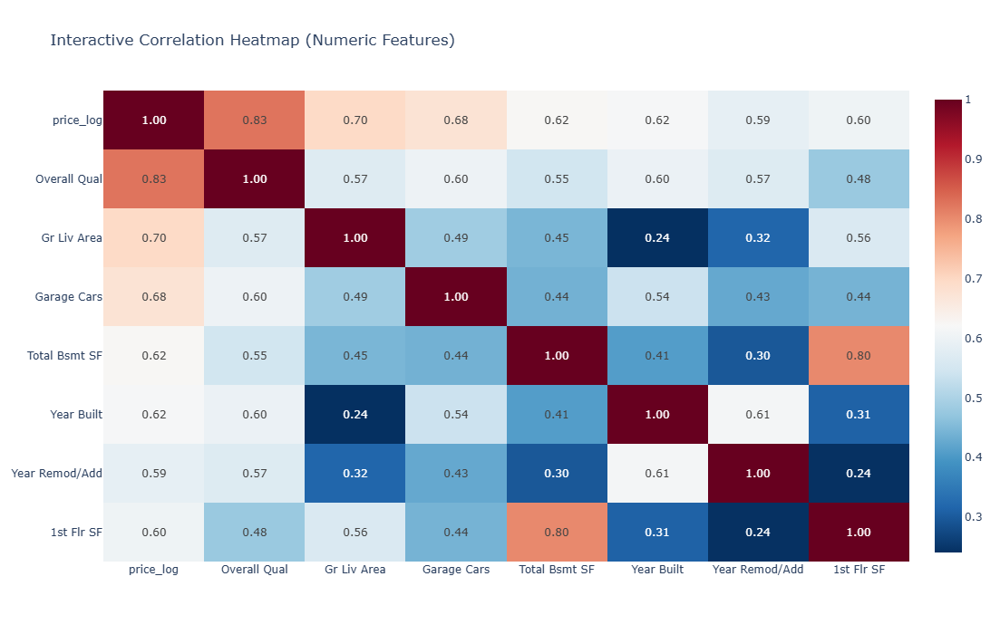

In [99]:

numeric_df = df_f.select_dtypes(include=['int64', 'float64'])

corr_matrix = numeric_df.corr()

fig = px.imshow(
    corr_matrix,
    text_auto=".2f",
    color_continuous_scale="RdBu_r",
    aspect="auto",
    title="Interactive Correlation Heatmap (Numeric Features)"
)

fig.update_layout(
    width=900,
    height=700
)

fig.show()

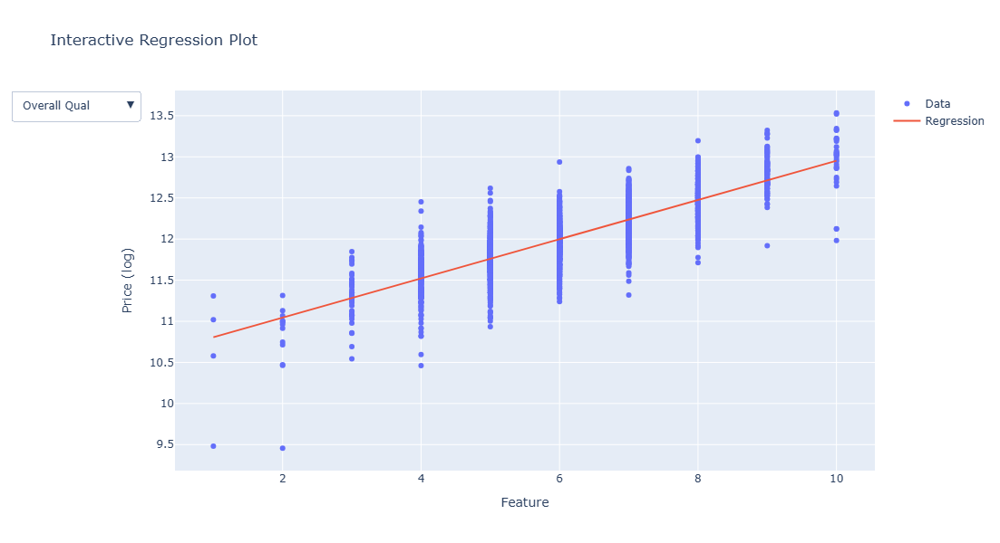

In [100]:
y_col = "price_log"
features = df_f.select_dtypes(include=['int64', 'float64']).columns.drop(y_col)

x_col = features[0]

fig = go.Figure()

buttons = []

for col in features:
    
    # Clean data (VERY IMPORTANT)
    temp = df_f[[col, y_col]].replace([np.inf, -np.inf], np.nan).dropna()

    x = temp[col]
    y = temp[y_col]

    # Skip bad columns
    if x.nunique() < 2:
        continue

    # Fit regression safely
    try:
        slope, intercept = np.polyfit(x, y, 1)
        y_pred = slope * x + intercept
    except:
        continue

    buttons.append(dict(
        method="update",
        label=col,
        args=[
            {
                "x": [x, x],
                "y": [y, y_pred]
            },
            {
                "title": f"{col} vs {y_col}"
            }
        ]
    ))

    # default plot (first valid column only)
    if len(fig.data) == 0:
        fig.add_trace(go.Scatter(x=x, y=y, mode='markers', name='Data'))
        fig.add_trace(go.Scatter(x=x, y=y_pred, mode='lines', name='Regression'))

fig.update_layout(
    title="Interactive Regression Plot",
    xaxis_title="Feature",
    yaxis_title="Price (log)",
    updatemenus=[dict(
        buttons=buttons,
        direction="down",
        showactive=True
    )],
    width=900,
    height=600
)

fig.show()

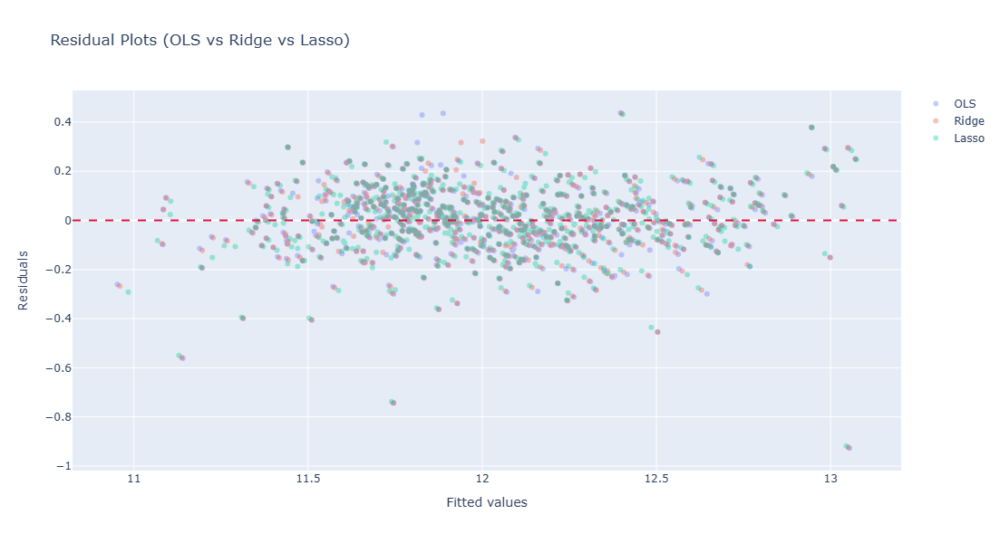

In [103]:

models = {
    "OLS": model_normal,
    "Ridge": model_ridge,
    "Lasso": model_lasso
}

fig = go.Figure()

for name, model in models.items():
    y_pred = model.predict(X_test)
    residuals = y_test - y_pred   

    fig.add_trace(go.Scatter(
        x=y_pred,
        y=residuals,
        mode='markers',
        name=name,
        opacity=0.35
    ))

fig.add_hline(
    y=0,
    line_dash="dash",
    line_color="crimson"
)

fig.update_layout(
    title="Residual Plots (OLS vs Ridge vs Lasso)",
    xaxis_title="Fitted values",
    yaxis_title="Residuals",
    width=900,
    height=600
)

fig.show()

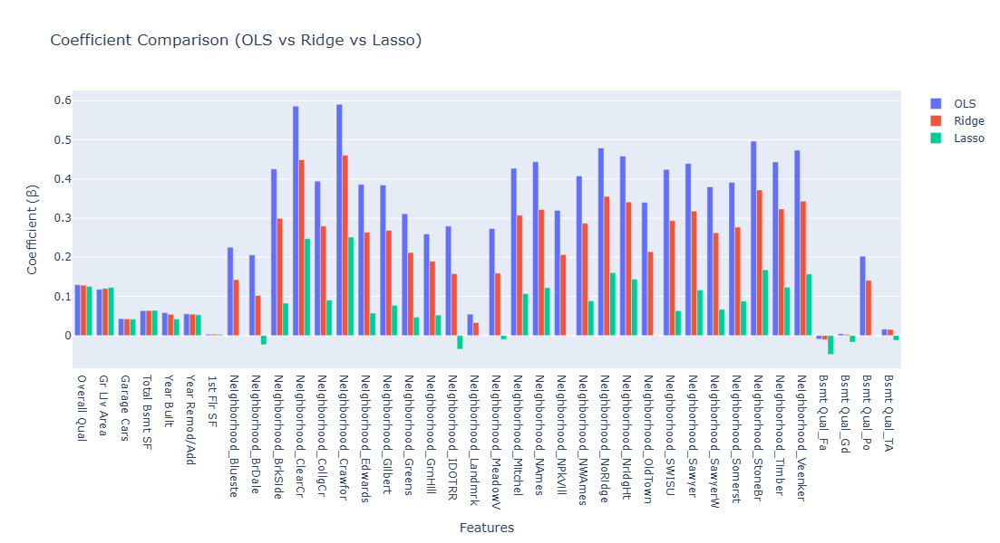

In [104]:

models = {
    "OLS": model_normal,
    "Ridge": model_ridge,
    "Lasso": model_lasso
}

feature_names = X_train.columns if hasattr(X_train, "columns") else [f"w{i}" for i in range(len(model_normal.w))]

fig = go.Figure()

for name, model in models.items():
    fig.add_trace(go.Bar(
        name=name,
        x=feature_names,
        y=model.w
    ))

fig.update_layout(
    title="Coefficient Comparison (OLS vs Ridge vs Lasso)",
    xaxis_title="Features",
    yaxis_title="Coefficient (β)",
    barmode="group",
    width=900,
    height=600
)

fig.show()